<a href="https://colab.research.google.com/github/gyeonminchae/Dacon_Income_prediction/blob/main/code_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. 기본 셋팅

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pwd

'/content'

In [ ]:
# apt-get : 패키지 설치 명령어
# -qq : 에러외의 메세지 숨기는 옵션키
!apt-get -qq install fonts-nanum

In [ ]:
# 데이터 시각화에 사용할 라이브러리
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import os
import seaborn as sns

# 브라우저에서 바로 그려지도록
%matplotlib inline

fe = fm.FontEntry(
    fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', # ttf 파일이 저장되어 있는 경로
    name='NanumGothic')                        # 이 폰트의 원하는 이름 설정
fm.fontManager.ttflist.insert(0, fe)              # Matplotlib에 폰트 추가
plt.rcParams.update({'font.size': 18, 'font.family': 'NanumGothic'}) # 폰트 설정

# 유니코드에서 음수 부호설정
plt.rcParams['axes.unicode_minus'] = False

In [ ]:
# 모델링 결과 확인 위한 라이브러리
!pip install shap
import shap

## Global Variables

In [ ]:
import easydict
args = easydict.EasyDict()

# # path 정보
args.default_path = '/content/drive/MyDrive/Year_Dream_School/Dacon_Income_prediction/data/'
# local
# args.default_path = '/Users/b-08/Documents/이어드림스쿨/Dacon_Income_prediction/data/'

args.train_csv = args.default_path+'train.csv'
args.test_csv = args.default_path+'test.csv'
args.default_submission_csv = args.default_path+'sample_submission.csv'

args.submission_csv = args.default_path+'result/submission_0326.csv'
args.save_results = args.default_path+"result/model_results.json"

# 데이터 분석을 위한 변수들
args.random_state = 2024
args.results = []

In [ ]:
import numpy as np
import pandas as pd

plt.style.use('fivethirtyeight')
plt.ion()

import warnings
warnings.filterwarnings('ignore')

# 2. 데이터 불러오기 및 확인

한 사람에 관련된 다양한 사회적, 경제적 정보 <br/>
ID : 학습 데이터 고유 ID <br/>
Age<br/>
Gender<br/>
Education_Status<br/>
Employment_Status<br/>
Working_Week (Yearly)<br/>
Industry_Status<br/>
Occupation_Status<br/>
Race<br/>
Hispanic_Origin<br/>
Martial_Status<br/>
Household_Status<br/>
Household_summary<br/>
Citizenship<br/>
Birth_Country<br/>
Birth_Country (Father)<br/>
Birth_Country (Mother)<br/>
Tax_Status<br/>
Gains - 소득금액<br/>
Losses - 손실금액<br/>
Divdends - 배당금액<br/>
Incom_Status<br/>
Income : 예측 목표, 1시간 단위의 소득을 예측


In [ ]:
ori_train = pd.read_csv(args.train_csv)
ori_test = pd.read_csv(args.test_csv)

ori_train.shape, ori_test.shape

((20000, 23), (10000, 22))

In [ ]:
ori_train.columns

Index(['ID', 'Age', 'Gender', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race',
       'Hispanic_Origin', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Birth_Country',
       'Birth_Country (Father)', 'Birth_Country (Mother)', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status', 'Income'],
      dtype='object')

In [ ]:
ori_test.columns

Index(['ID', 'Age', 'Gender', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race',
       'Hispanic_Origin', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Birth_Country',
       'Birth_Country (Father)', 'Birth_Country (Mother)', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status'],
      dtype='object')

In [ ]:
# 데이터 기본 정보 확인 함수
def data_info(df):
  ''' 데이터의 기본 정보 '''
  print('\n##### shape \n', df.shape)
  print('\n##### columns \n', df.columns)
  print('\n##### info \n',df.info())
  print('\n##### describe \n',df.describe())

In [ ]:
print(data_info(ori_train))


##### shape 
 (20000, 23)

##### columns 
 Index(['ID', 'Age', 'Gender', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race',
       'Hispanic_Origin', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Birth_Country',
       'Birth_Country (Father)', 'Birth_Country (Mother)', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status', 'Income'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   ID                      20000 non-null  object
 1   Age                     20000 non-null  int64 
 2   Gender                  20000 non-null  object
 3   Education_Status        20000 non-null  object
 4   Employment_Status       20000 non-null  object
 5   Working_Week (Yearly)   20000 non-null  i

# 3. EDA & Data Preprocessing

## 3-1) EDA

#### 데이터 설정


In [ ]:
ori_train['ID'].nunique(), ori_train.shape[0]

(20000, 20000)

In [ ]:
ori_train.drop(['ID'], axis=1, inplace=True)
ori_train.head()

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,...,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
0,63,M,Middle (7-8),Full-Time,4,Social Services,Services,White,All other,Married,...,Native,US,US,US,Nonfiler,0,0,0,Unknown,425
1,37,M,Associates degree (Vocational),Full-Time,52,Entertainment,Services,White,All other,Separated,...,Native,US,US,US,Single,0,0,0,Under Median,0
2,58,F,High graduate,Full-Time,52,Manufacturing (Non-durable),Admin Support (include Clerical),Black,All other,Married,...,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),3411,0,0,Under Median,860
3,44,M,High graduate,Full-Time,52,Retail,Technicians & Support,White,All other,Divorced,...,Native,US,US,US,Single,0,0,0,Under Median,850
4,37,F,High graduate,Full-Time,52,Retail,Sales,White,All other,Divorced,...,Native,US,US,US,Head of Household (HOH),0,0,0,Unknown,570


In [ ]:
ori_test.set_index(['ID'], inplace=True)
ori_test.head()

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,...,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status
ID,,,,,,,,,,,,,,,,,,,,,
TEST_0000,79,M,High Junior,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Single,...,Householder,Native,US,Unknown,Unknown,Single,0,0,0,Under Median
TEST_0001,47,M,Elementary (5-6),Children or Armed Forces,0,Not in universe or children,Unknown,White,Other Spanish,Single,...,Child 18 or older,Native,US,US,US,Nonfiler,0,0,0,Under Median
TEST_0002,18,F,High Junior,Children or Armed Forces,52,Retail,Services,White,All other,Single,...,Child 18 or older,Native,US,US,US,Single,0,0,0,Under Median
TEST_0003,39,F,Associates degree (Vocational),Full-Time,30,Medical (except Hospitals),Services,White,All other,Married,...,Spouse of householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,0,Unknown
TEST_0004,6,M,Children,Children or Armed Forces,0,Not in universe or children,Unknown,White,Mexican-American,Single,...,Child under 18 never married,Native,US,US,US,Nonfiler,0,0,0,Unknown


#### 자동화 함수

In [ ]:
# [수치형] 각 컬럼별 박스플롯
import math

def make_subplot_boxplot(df,col_num) :
  ''' 수치형 컬럼의 박스플롯'''
  num_cols = df.columns

  k = len(num_cols)
  row_num = math.ceil(k/col_num)
  plt.figure(figsize=(col_num*4,row_num*3))
  for i in range(k) :
      plt.subplot(row_num,col_num,i+1) # 꼭 +1 을 붙여줘야한다.(range는 0부터 시작인데 subplot은 1부터 시작이라서)
      plt.boxplot(df.iloc[:,i])
      plt.title(num_cols[i])
  plt.tight_layout()
  plt.show()

In [ ]:
# [수치형] 각 컬럼별 히스토그램
def make_subplot_histplot(df,col_num) :
  ''' 수치형 컬럼의 히스토그램'''

  k = len(df.columns)
  row_num = math.ceil(k/col_num)

  sns.set_theme(font ='NanumGothic',style='whitegrid')
  plt.figure(figsize=(col_num*4,row_num*3))
  for i in range(k) :
      plt.subplot(row_num,col_num,i+1) # 꼭 +1 을 붙여줘야한다.(range는 0부터 시작인데 subplot은 1부터 시작이라서)
      sns.histplot(df.iloc[:,i],
                   bins=10,
                   kde=True, ## 커널밀도 함수 곡선 추가
                   stat='percent', ## y값 계산 방식
                   color='r',
                   alpha=0.7)
      plt.title(ori_train.columns[i])
  plt.tight_layout()
  plt.show()

In [ ]:
# [범주형] 각 컬럼별 countplot

def make_subplot_countplot(df,cols,col_num) :
  discrete_df = df[cols]
  k = len(cols)
  row_num = math.ceil(k/col_num)
  plt.figure(figsize=(col_num*4,row_num*3))
  for i in range(k) :
      plt.subplot(row_num,col_num,i+1) # 꼭 +1 을 붙여줘야한다.(range는 0부터 시작인데 subplot은 1부터 시작이라서)
      sns.countplot(data=discrete_df, x=cols[i], palette='Blues')
      plt.title(cols[i])
      plt.xlabel('values')
  plt.tight_layout()
  plt.show()

#### Visualization Function

##### - 범주형 데이터 countplot

In [ ]:
def count_plot(feature1):
  sns.countplot(data=ori_train, y=feature1)

##### - 수치형 데이터 histplot

In [ ]:
def hist_plot(feature1):
  sns.histplot(data=ori_train, x=feature1, kde=True)

##### - 수치형 데이터 displot 그리기

In [ ]:
def dis_plot(feature1, col):
  sns.displot(data=ori_train, x=feature1, col=col, multiple="dodge")

##### - 이산형/범주형 데이터 bar plot 그리기

In [ ]:
def bar_plot(feature1, feature2, hue):
  sns.catplot(data=ori_train, x=feature1, y=feature2, kind="bar")

##### - 수치형 데이터 boxplot 그리기

In [ ]:
def box_plot(feature1, feature2):
  sns.boxplot(ori_train, x=feature1, y=feature2)

##### - 수치형 데이터 boxplot 그리기(2)

In [ ]:
def box_plot2(feature1, feature2, feature3):
  sns.boxplot(ori_train, x=feature1, y=feature2, hue=feature3)

##### - [특정조건] 범주형 데이터 bar chart 그리기

In [ ]:
# 범주형 데이터 bar chart 그리기
def bar_chart(feature):
    survived = train[train['survived']==1][feature].value_counts()
    dead = train[train['survived']==0][feature].value_counts()
    df = pd.DataFrame([survived,dead])
    df.index = ['survived','Dead']
    df.plot(kind='bar',stacked=True, figsize=(10,5))

In [ ]:
ori_train.columns

Index(['Age', 'Gender', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race',
       'Hispanic_Origin', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Birth_Country',
       'Birth_Country (Father)', 'Birth_Country (Mother)', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status', 'Income'],
      dtype='object')

## 3-2) Missing Value 및 Outlier 확인

### 3-2-1) missing value 확인

In [ ]:
ori_train.isnull().sum()

Age                       0
Gender                    0
Education_Status          0
Employment_Status         0
Working_Week (Yearly)     0
Industry_Status           0
Occupation_Status         0
Race                      0
Hispanic_Origin           0
Martial_Status            0
Household_Status          0
Household_Summary         0
Citizenship               0
Birth_Country             0
Birth_Country (Father)    0
Birth_Country (Mother)    0
Tax_Status                0
Gains                     0
Losses                    0
Dividends                 0
Income_Status             0
Income                    0
dtype: int64

In [ ]:
ori_test.isnull().sum()

Age                       0
Gender                    0
Education_Status          0
Employment_Status         0
Working_Week (Yearly)     0
Industry_Status           0
Occupation_Status         0
Race                      0
Hispanic_Origin           0
Martial_Status            0
Household_Status          1
Household_Summary         0
Citizenship               0
Birth_Country             0
Birth_Country (Father)    0
Birth_Country (Mother)    0
Tax_Status                0
Gains                     0
Losses                    0
Dividends                 0
Income_Status             0
dtype: int64

## 3-3) Outlier 확인

### 반응 변수 확인

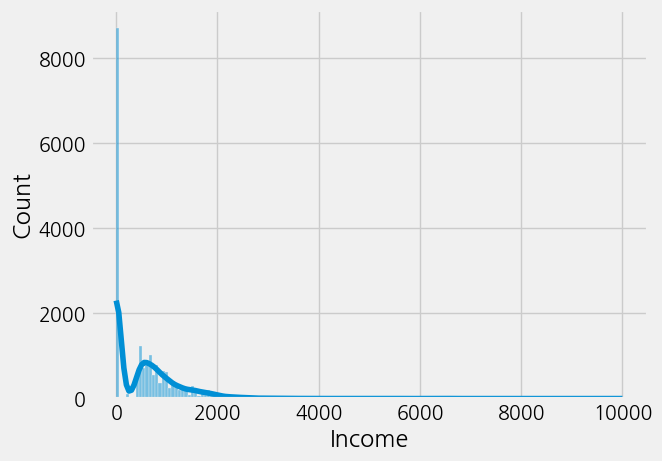

In [ ]:
hist_plot("Income")

In [ ]:
pd.set_option('display.max_columns', 23)
ori_train[ori_train['Income'] == 9999]

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
2008,46,M,Doctorate degree,Children or Armed Forces,52,Other professional services,Professional,White,All other,Single,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Over Median,9999


In [ ]:
ori_train = ori_train[ori_train['Income'] != 9999]
ori_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19999 entries, 0 to 19999
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     19999 non-null  int64 
 1   Gender                  19999 non-null  object
 2   Education_Status        19999 non-null  object
 3   Employment_Status       19999 non-null  object
 4   Working_Week (Yearly)   19999 non-null  int64 
 5   Industry_Status         19999 non-null  object
 6   Occupation_Status       19999 non-null  object
 7   Race                    19999 non-null  object
 8   Hispanic_Origin         19999 non-null  object
 9   Martial_Status          19999 non-null  object
 10  Household_Status        19999 non-null  object
 11  Household_Summary       19999 non-null  object
 12  Citizenship             19999 non-null  object
 13  Birth_Country           19999 non-null  object
 14  Birth_Country (Father)  19999 non-null  object
 15  Birth_C

### 3-3-1) 수치형 변수

In [ ]:
ori_train.describe(include=[np.number])

,Age,Working_Week (Yearly),Gains,Losses,Dividends,Income
count,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000
mean,35.631982,34.942197,383.148657,40.204160,123.457623,554.093005
std,17.994715,22.254822,4144.350217,279.189512,1206.979290,698.384496
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,7.000000,0.000000,0.000000,0.000000,0.000000
50%,34.000000,52.000000,0.000000,0.000000,0.000000,500.000000
75%,47.000000,52.000000,0.000000,0.000000,0.000000,875.000000
max,90.000000,52.000000,99999.000000,4356.000000,45000.000000,9916.000000


In [ ]:
len(ori_train.columns)

22

In [ ]:
# ori_train['Age'].value_counts().sort_index()

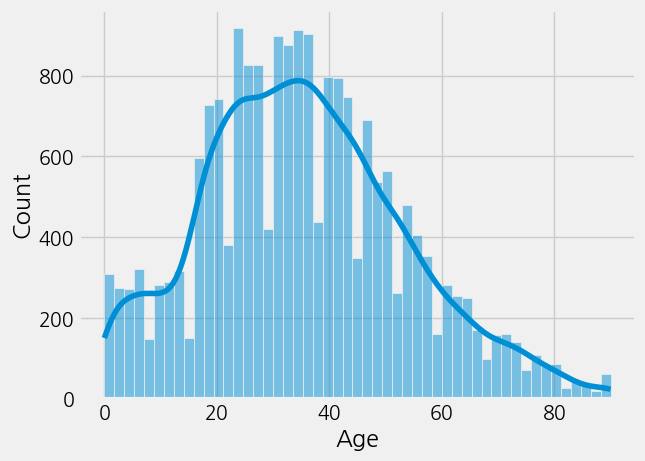

In [ ]:
hist_plot("Age")

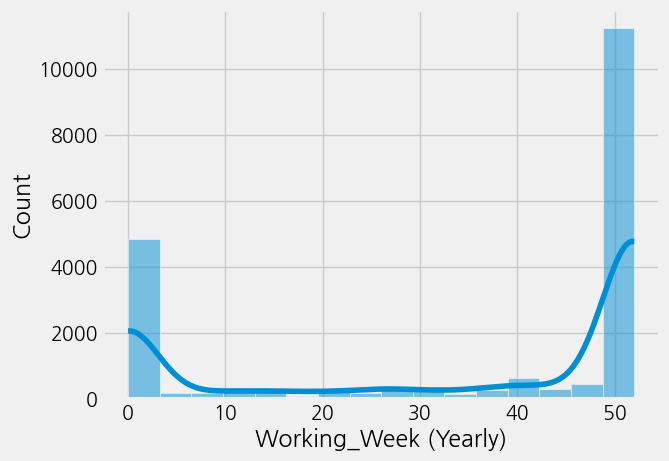

In [ ]:
# min/max scailing
hist_plot("Working_Week (Yearly)")

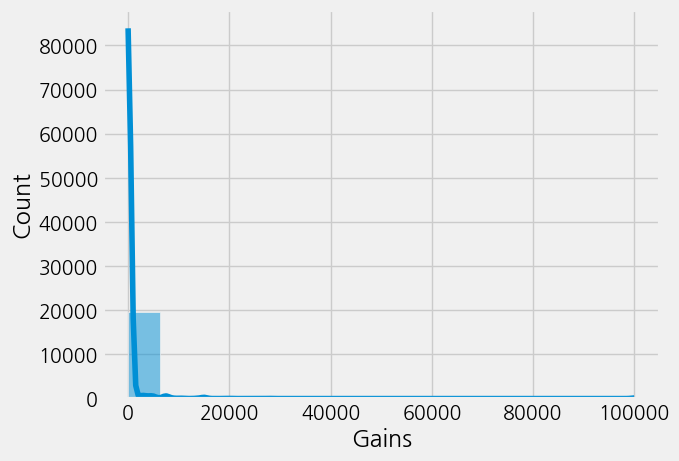

In [ ]:
# 99999 - 해당 값들 평균값으로 제거 - robust
hist_plot("Gains")

In [ ]:
pd.set_option('display.max_columns', 23)
ori_train[ori_train['Gains'] == 99999]

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
45,41,M,College,Full-Time,52,Public Administration,Protective Services,White,Central or South American,Married,Householder,Householder,Foreign-born (Non-US Citizen),Columbia,Columbia,Columbia,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,0
243,53,M,Bachelors degree,Children or Armed Forces,52,Manufacturing (Durable),Management,Asian/Pacific,All other,Married,Householder,Householder,Foreign-born (Naturalized US Citizen),India,India,India,Married Filling Jointly both under 65 (MFJ),99999,0,875,Over Median,0
485,33,F,College,Full-Time,52,Retail,Services,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,2000,Over Median,0
1236,44,M,Doctorate degree,Full-Time,52,Hospitals,Professional,White,Mexican-American,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,250,Over Median,0
1293,47,M,Masters degree,Full-Time,52,Finance Insurance & Real Estate,Sales,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,3000,Over Median,0
1338,24,M,College,Children or Armed Forces,52,Not in universe or children,Unknown,Asian/Pacific,All other,Single,Nonfamily householder,Householder,Foreign-born (Non-US Citizen),South Korea,South Korea,South Korea,Single,99999,0,0,Unknown,0
1720,32,M,Bachelors degree,Children or Armed Forces,52,Hospitals,Professional,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,0,Unknown,0
2009,48,M,High Freshman,Full-Time,52,Education,Services,White,Central or South American,Divorced,Householder,Householder,Foreign-born (Non-US Citizen),Ecuador,Ecuador,Ecuador,Head of Household (HOH),99999,0,0,Over Median,1025
2677,35,M,Professional degree,Children or Armed Forces,52,Hospitals,Professional,White,All other,Single,Nonfamily householder,Householder,Native,US,Canada,Canada,Single,99999,0,3500,Over Median,0
3525,50,M,College,Children or Armed Forces,52,Wholesale,Sales,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,500,Over Median,0


In [ ]:
ori_train = ori_train[ori_train['Gains'] != 99999]
ori_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19969 entries, 0 to 19999
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     19969 non-null  int64 
 1   Gender                  19969 non-null  object
 2   Education_Status        19969 non-null  object
 3   Employment_Status       19969 non-null  object
 4   Working_Week (Yearly)   19969 non-null  int64 
 5   Industry_Status         19969 non-null  object
 6   Occupation_Status       19969 non-null  object
 7   Race                    19969 non-null  object
 8   Hispanic_Origin         19969 non-null  object
 9   Martial_Status          19969 non-null  object
 10  Household_Status        19969 non-null  object
 11  Household_Summary       19969 non-null  object
 12  Citizenship             19969 non-null  object
 13  Birth_Country           19969 non-null  object
 14  Birth_Country (Father)  19969 non-null  object
 15  Birth_C

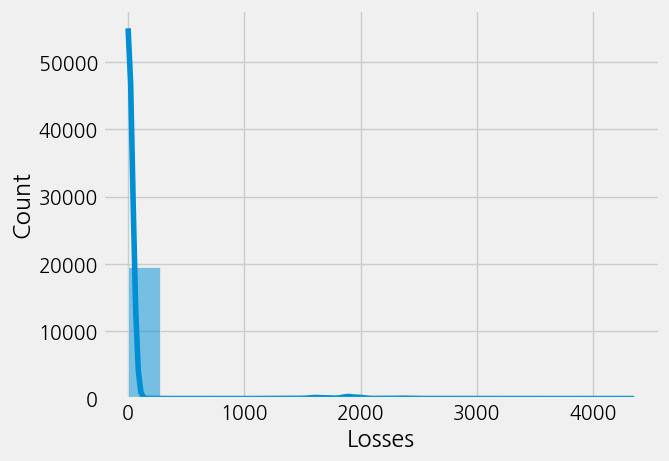

In [ ]:
# robust로
hist_plot("Losses")

In [ ]:
pd.set_option('display.max_columns', 23)
ori_train['Losses'].value_counts().sort_index()
# ori_train[ori_train['Losses'] >= np.quantile(ori_train['Losses'], 0.90)]

Losses
0       19537
155         1
213         6
323         3
419         1
        ...  
2824        1
3175        1
3770        1
3900        1
4356        2
Name: count, Length: 86, dtype: int64

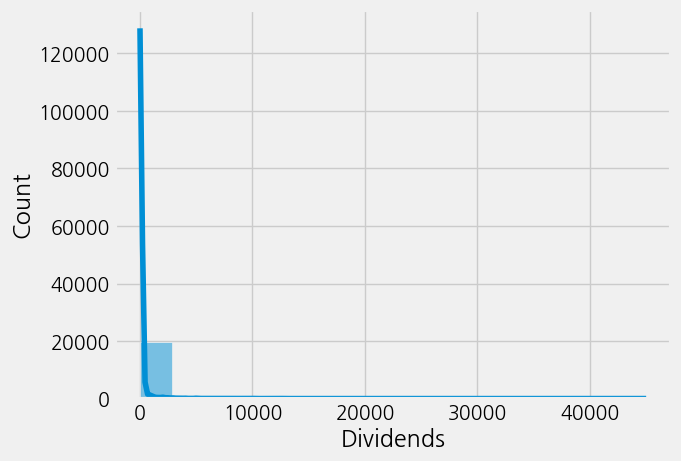

In [ ]:
# robust로
hist_plot("Dividends")

In [ ]:
# robust
ori_train['Dividends'].value_counts().sort_index()

Dividends
0        17909
1           60
2           20
3           20
4            8
         ...  
35000        1
38758        1
40000        3
42000        2
45000        1
Name: count, Length: 417, dtype: int64

In [ ]:
ori_train.describe(include=[np.number])

,Age,Working_Week (Yearly),Gains,Losses,Dividends,Income
count,19969.000000,19969.000000,19969.000000,19969.000000,19969.000000,19969.000000
mean,35.622214,34.920377,233.492914,40.264560,121.295408,554.365517
std,18.002507,22.261201,1506.723139,279.394809,1192.539218,698.392533
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,7.000000,0.000000,0.000000,0.000000,0.000000
50%,34.000000,52.000000,0.000000,0.000000,0.000000,500.000000
75%,47.000000,52.000000,0.000000,0.000000,0.000000,875.000000
max,90.000000,52.000000,27828.000000,4356.000000,45000.000000,9916.000000


### 3-3-2) 명목형 변수

In [ ]:
ori_train.columns # 제외

Index(['Age', 'Gender', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race',
       'Hispanic_Origin', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Birth_Country',
       'Birth_Country (Father)', 'Birth_Country (Mother)', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status', 'Income'],
      dtype='object')

In [ ]:
all_columns = ori_train.columns.tolist()
num_columns = ori_train._get_numeric_data().columns.tolist()
cat_columns = list(set(all_columns) - set(num_columns))

In [ ]:
cat_columns

['Gender',
 'Birth_Country (Mother)',
 'Race',
 'Income_Status',
 'Household_Summary',
 'Birth_Country',
 'Tax_Status',
 'Citizenship',
 'Household_Status',
 'Birth_Country (Father)',
 'Occupation_Status',
 'Employment_Status',
 'Education_Status',
 'Martial_Status',
 'Industry_Status',
 'Hispanic_Origin']

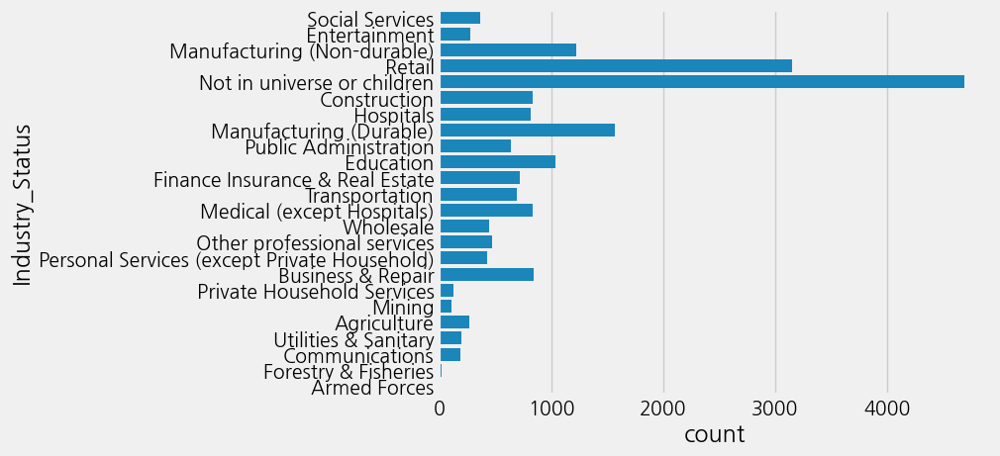

In [ ]:
count_plot('Industry_Status') # Binary Encoding

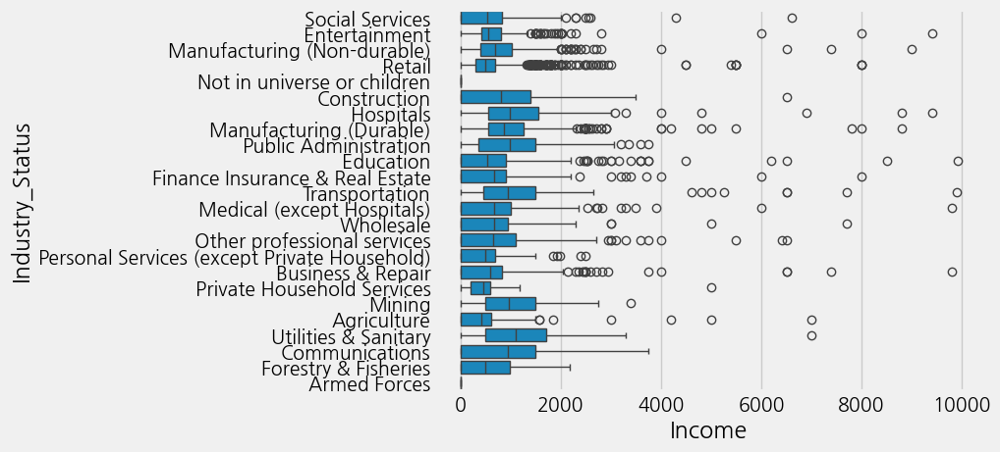

In [ ]:
box_plot('Income', 'Industry_Status')

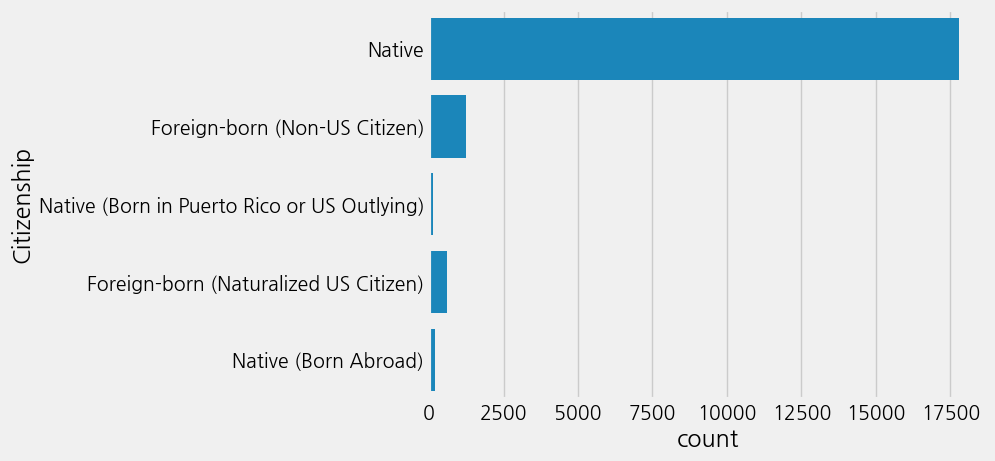

In [ ]:
count_plot('Citizenship') # Onehot Encoding

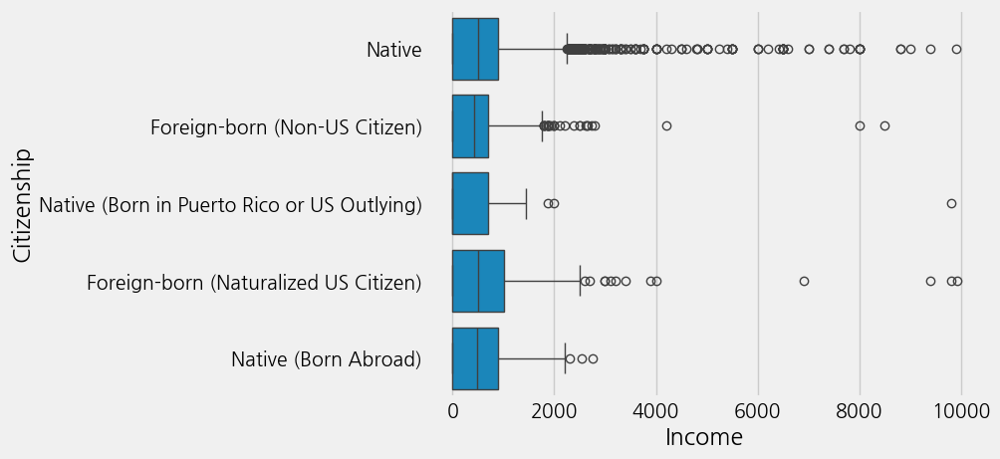

In [ ]:
box_plot('Income', 'Citizenship')

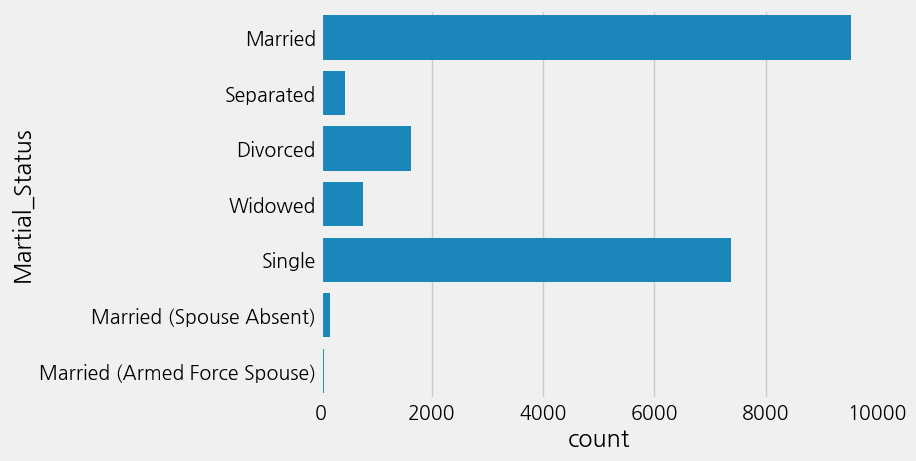

In [ ]:
count_plot('Martial_Status') # Onehot Encoding

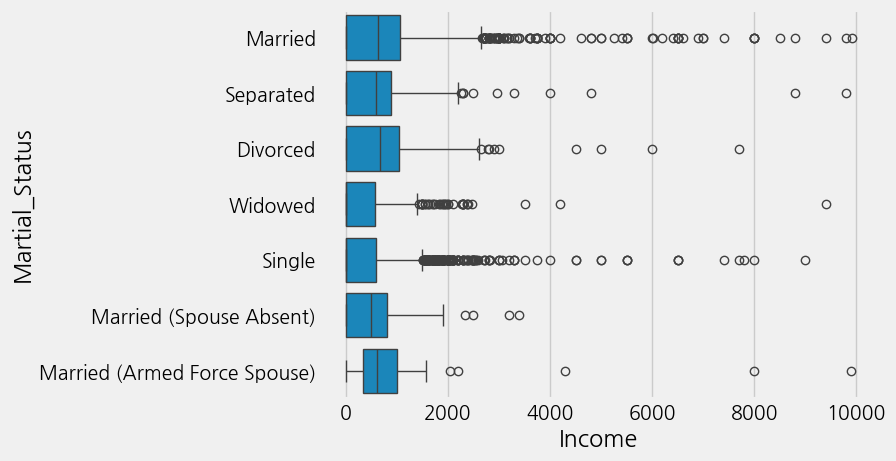

In [ ]:
box_plot('Income', 'Martial_Status')

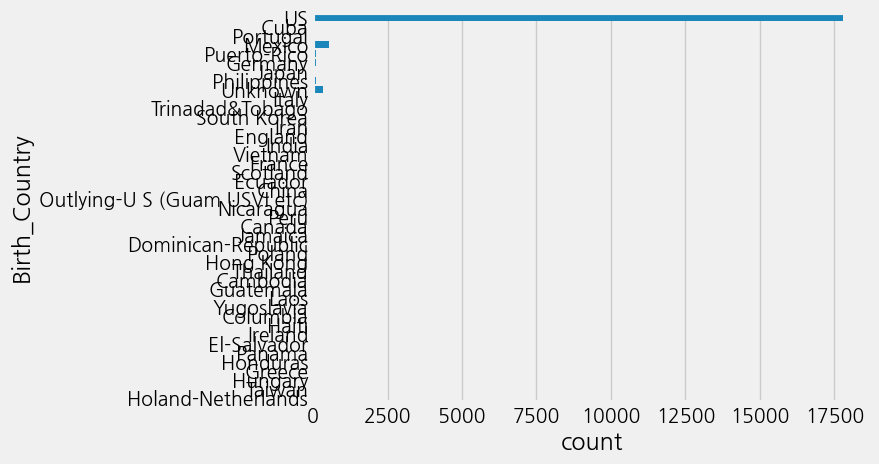

In [ ]:
count_plot('Birth_Country') # Binary Encoding

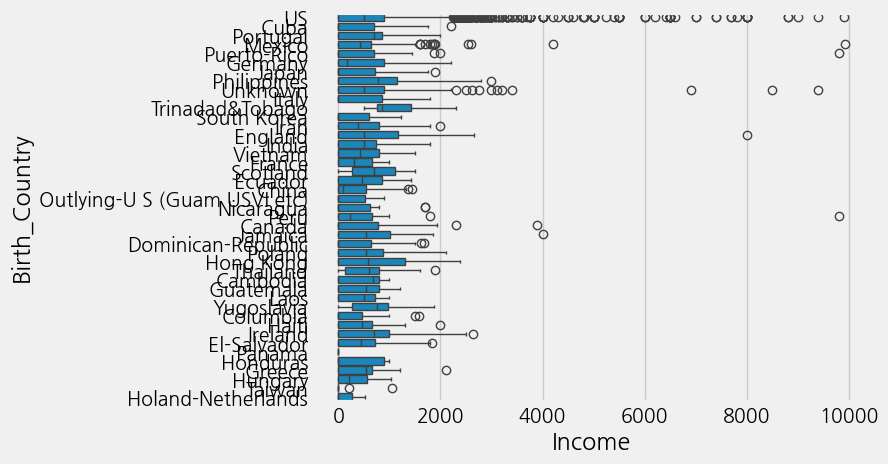

In [ ]:
box_plot('Income', 'Birth_Country')

In [ ]:
ori_train['Birth_Country'].value_counts().sort_index()

Birth_Country
Cambodia                            8
Canada                             75
China                              28
Columbia                           35
Cuba                               58
Dominican-Republic                 49
Ecuador                            30
El-Salvador                        68
England                            47
France                             14
Germany                            90
Greece                             13
Guatemala                          28
Haiti                              25
Holand-Netherlands                  3
Honduras                           14
Hong Kong                          16
Hungary                             4
India                              54
Iran                               24
Ireland                            21
Italy                              35
Jamaica                            45
Japan                              30
Laos                               11
Mexico                            53

In [ ]:
ori_train[ori_train['Birth_Country'] == 'US']

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
0,63,M,Middle (7-8),Full-Time,4,Social Services,Services,White,All other,Married,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Unknown,425
1,37,M,Associates degree (Vocational),Full-Time,52,Entertainment,Services,White,All other,Separated,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,0
2,58,F,High graduate,Full-Time,52,Manufacturing (Non-durable),Admin Support (include Clerical),Black,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),3411,0,0,Under Median,860
3,44,M,High graduate,Full-Time,52,Retail,Technicians & Support,White,All other,Divorced,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,850
4,37,F,High graduate,Full-Time,52,Retail,Sales,White,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,0,0,Unknown,570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,33,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Handlers/Cleaners,White,All other,Single,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,1300
19996,20,F,College,Full-Time,12,Education,Admin Support (include Clerical),White,Mexican-American,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,Mexico,Mexico,Nonfiler,0,0,0,Under Median,850
19997,22,M,College,Children or Armed Forces,52,Transportation,Technicians & Support,White,All other,Single,In group quarters,Group Quarters- Secondary individual,Native,US,US,US,Single,0,0,0,Unknown,999
19998,76,F,High graduate,Not Working,0,Not in universe or children,Unknown,White,All other,Widowed,Nonfamily householder,Householder,Native,US,Scotland,England,Single,0,0,0,Under Median,0


In [ ]:
ori_train['Birth_Country'] = ori_train['Birth_Country'].where(ori_train['Birth_Country'] == 'US', 0)
ori_train['Birth_Country'] = ori_train['Birth_Country'].where(ori_train['Birth_Country'] != 'US', 1)

ori_test['Birth_Country'] = ori_test['Birth_Country'].where(ori_test['Birth_Country'] == 'US', 0)
ori_test['Birth_Country'] = ori_test['Birth_Country'].where(ori_test['Birth_Country'] != 'US', 1)

In [ ]:
ori_train['Birth_Country'].value_counts()

Birth_Country
1    17800
0     2169
Name: count, dtype: int64

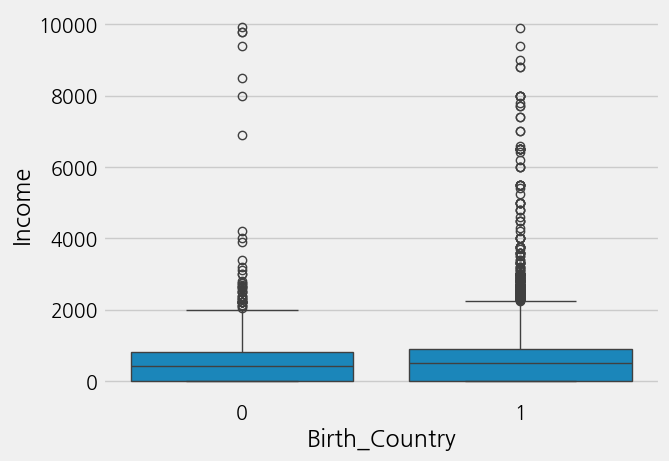

In [ ]:
box_plot('Birth_Country', 'Income')

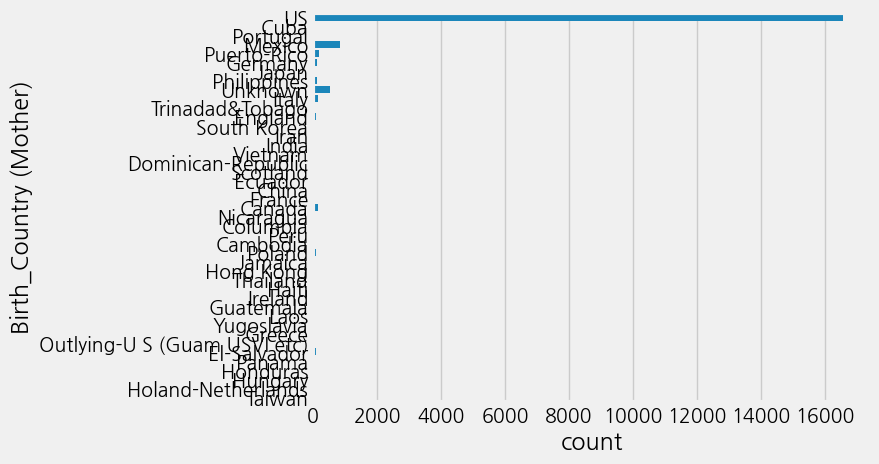

In [ ]:
count_plot('Birth_Country (Mother)') # Binary Encoding

In [ ]:
ori_train['Birth_Country (Mother)'] = ori_train['Birth_Country (Mother)'].where(ori_train['Birth_Country (Mother)'] == 'US', 0)
ori_train['Birth_Country (Mother)'] = ori_train['Birth_Country (Mother)'].where(ori_train['Birth_Country (Mother)'] != 'US', 1)

ori_test['Birth_Country (Mother)'] = ori_test['Birth_Country (Mother)'].where(ori_test['Birth_Country (Mother)'] == 'US', 0)
ori_test['Birth_Country (Mother)'] = ori_test['Birth_Country (Mother)'].where(ori_test['Birth_Country (Mother)'] != 'US', 1)

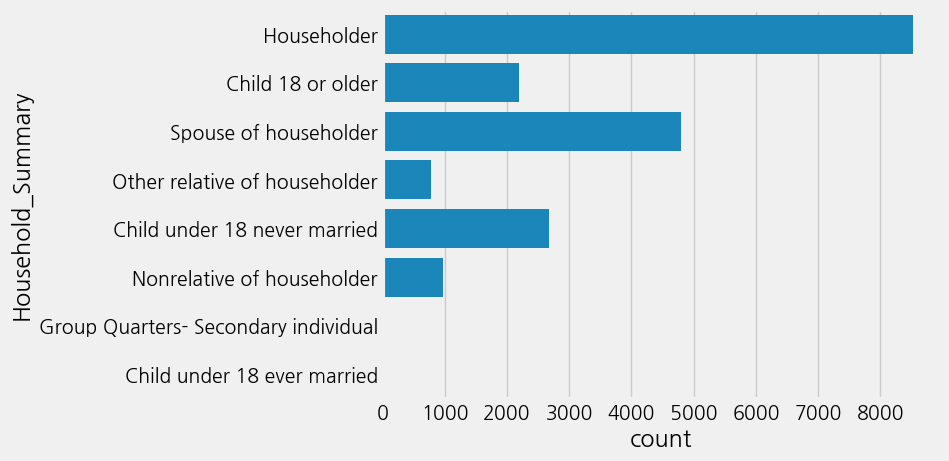

In [ ]:
count_plot('Household_Summary') # Onehot Encoding

In [ ]:
ori_train['Household_Summary'] = ori_train['Household_Summary'].where(ori_train['Household_Summary'] != 'Child under 18 ever married', 'Child under 18 never married')

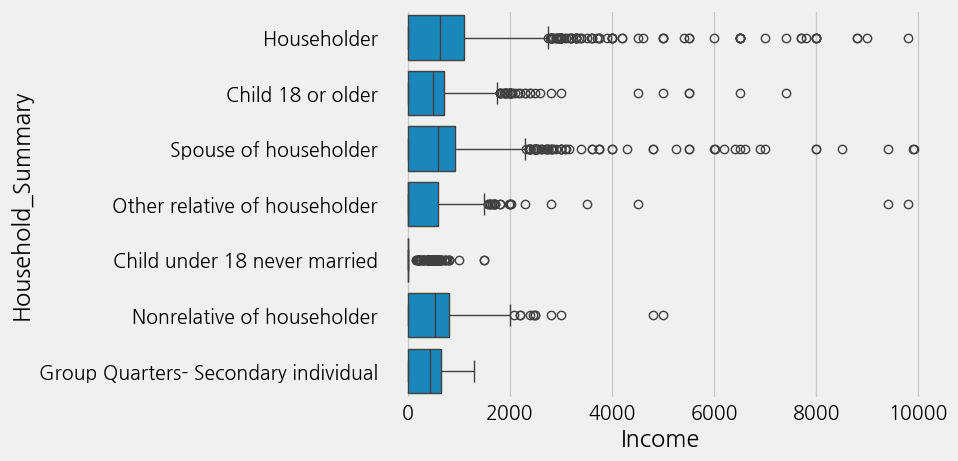

In [ ]:
box_plot('Income', 'Household_Summary')

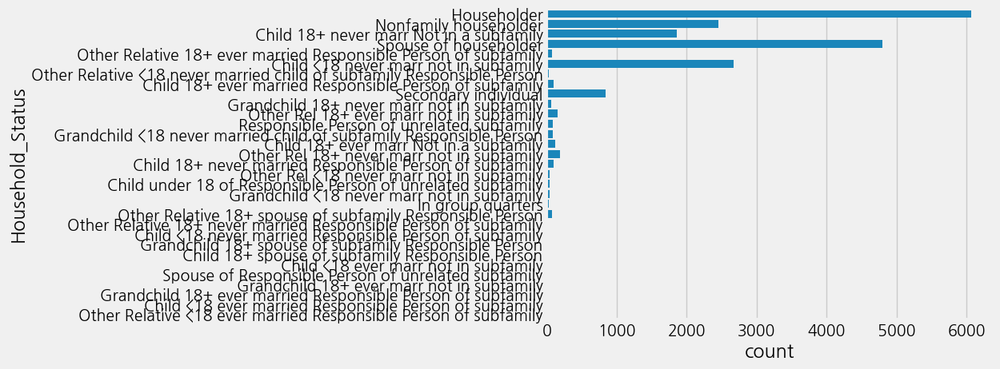

In [ ]:
count_plot('Household_Status') # Binary Encoding

In [ ]:
ori_train.loc[ori_train['Household_Status'] == 'Child 18+ ever marr Not in a subfamily','Household_Status'] = 'Child 18+ never marr Not in a subfamily'

ori_train.loc[ori_train['Household_Status'] == 'Child 18+ ever married Responsible Person of subfamily','Household_Status'] = 'Child 18+ never married Responsible Person of subfamily'

ori_train.loc[ori_train['Household_Status'] == 'Child <18 ever marr not in subfamily','Household_Status'] = 'Child <18 never marr not in subfamily'
ori_train.loc[ori_train['Household_Status'] == 'Child <18 ever married Responsible Person of subfamily','Household_Status'] = 'Child <18 never married Responsible Person of subfamily'

ori_train.loc[ori_train['Household_Status'] == 'Grandchild 18+ ever marr not in subfamily','Household_Status'] = 'Grandchild 18+ never marr not in subfamily'
ori_train.loc[ori_train['Household_Status'] == 'Grandchild 18+ ever married Responsible Person of subfamily','Household_Status'] = 'Grandchild 18+ never married Responsible Person of subfamily'

ori_train.loc[ori_train['Household_Status'] == 'Other Rel 18+ ever marr not in subfamily','Household_Status'] = 'Other Rel 18+ never marr not in subfamily'
ori_train.loc[ori_train['Household_Status'] == 'Other Relative 18+ ever married Responsible Person of subfamily','Household_Status'] = 'Other Relative 18+ never married Responsible Person of subfamily'
ori_train.loc[ori_train['Household_Status'] == 'Other Relative <18 ever married Responsible Person of subfamily','Household_Status'] = 'Other Relative <18 never married child of subfamily Responsible Person'

In [ ]:
ori_test.loc[ori_test['Household_Status'] == 'Child 18+ ever marr Not in a subfamily','Household_Status'] = 'Child 18+ never marr Not in a subfamily'

ori_test.loc[ori_test['Household_Status'] == 'Child 18+ ever married Responsible Person of subfamily','Household_Status'] = 'Child 18+ never married Responsible Person of subfamily'

ori_test.loc[ori_test['Household_Status'] == 'Child <18 ever marr not in subfamily','Household_Status'] = 'Child <18 never marr not in subfamily'

ori_test.loc[ori_test['Household_Status'] == 'Grandchild 18+ ever marr not in subfamily','Household_Status'] = 'Grandchild 18+ never marr not in subfamily'

ori_test.loc[ori_test['Household_Status'] == 'Other Rel 18+ ever marr not in subfamily','Household_Status'] = 'Other Rel 18+ never marr not in subfamily'

ori_test.loc[ori_test['Household_Status'] == 'Other Relative 18+ ever married Responsible Person of subfamily','Household_Status'] = 'Other Relative 18+ never married Responsible Person of subfamily'

In [ ]:
ori_train['Household_Status'].value_counts().sort_index()

Household_Status
Child 18+ never marr Not in a subfamily                                   1978
Child 18+ never married Responsible Person of subfamily                    196
Child 18+ spouse of subfamily Responsible Person                            16
Child <18 never marr not in subfamily                                     2673
Child <18 never married Responsible Person of subfamily                      9
Child under 18 of Responsible Person of unrelated subfamily                 39
Grandchild 18+ never marr not in subfamily                                  66
Grandchild 18+ never married Responsible Person of subfamily                 1
Grandchild 18+ spouse of subfamily Responsible Person                        1
Grandchild <18 never marr not in subfamily                                  43
Grandchild <18 never married child of subfamily Responsible Person          88
Householder                                                               6063
In group quarters                  

In [ ]:
ori_train = ori_train[ori_train['Household_Status'] != 'Grandchild 18+ never married Responsible Person of subfamily']
ori_train = ori_train[ori_train['Household_Status'] != 'Grandchild 18+ spouse of subfamily Responsible Person']

Grandchild 18+ never married Responsible Person of subfamily<br>
Grandchild 18+ spouse of subfamily Responsible Person<br>

In [ ]:
ori_test['Household_Status'].value_counts().sort_index()

Household_Status
Child 18+ never marr Not in a subfamily                                    973
Child 18+ never married Responsible Person of subfamily                     92
Child 18+ spouse of subfamily Responsible Person                             4
Child <18 never marr not in subfamily                                     1291
Child <18 never married Responsible Person of subfamily                      3
Child under 18 of Responsible Person of unrelated subfamily                 23
Grandchild 18+ never marr not in subfamily                                  37
Grandchild <18 never marr not in subfamily                                  37
Grandchild <18 never married child of subfamily Responsible Person          33
Householder                                                               3128
In group quarters                                                           10
Nonfamily householder                                                     1191
Other Rel 18+ never marr not in sub

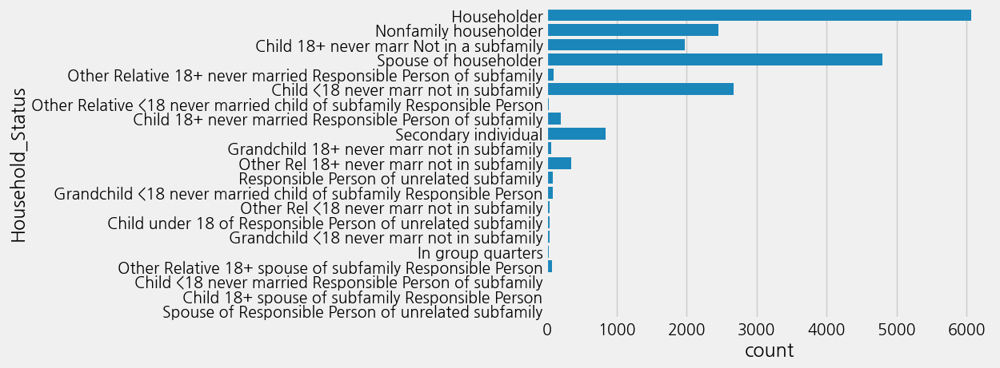

In [ ]:
count_plot('Household_Status') # Binary Encoding

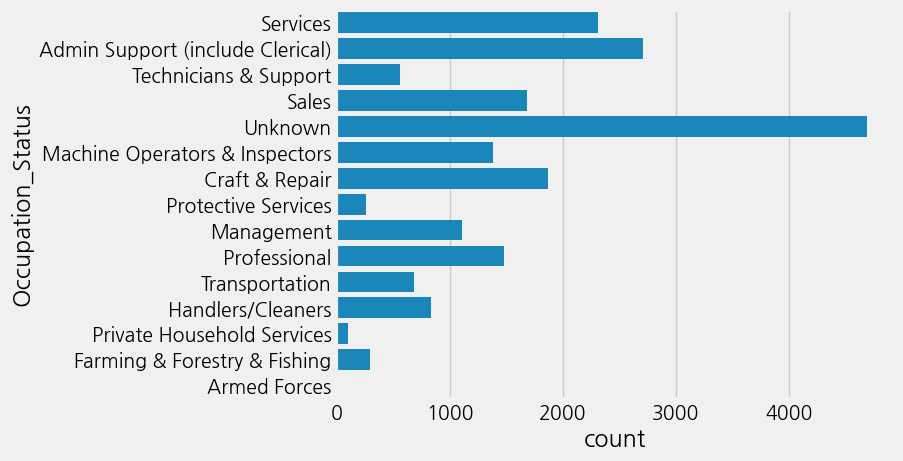

In [ ]:
count_plot('Occupation_Status') # Binary Encoding

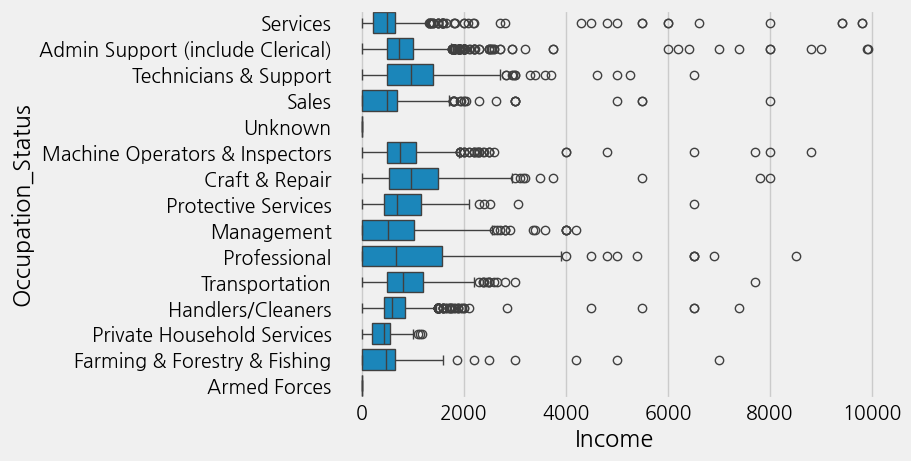

In [ ]:
box_plot('Income', 'Occupation_Status')

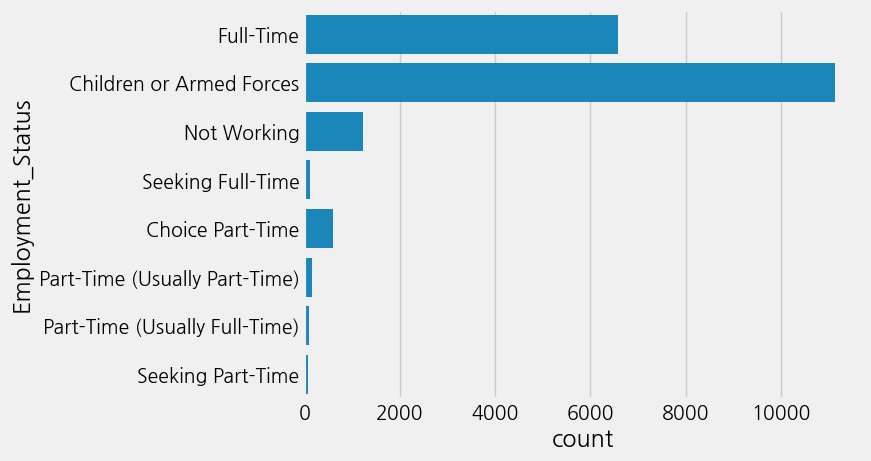

In [ ]:
count_plot('Employment_Status') # Onehot Encoding

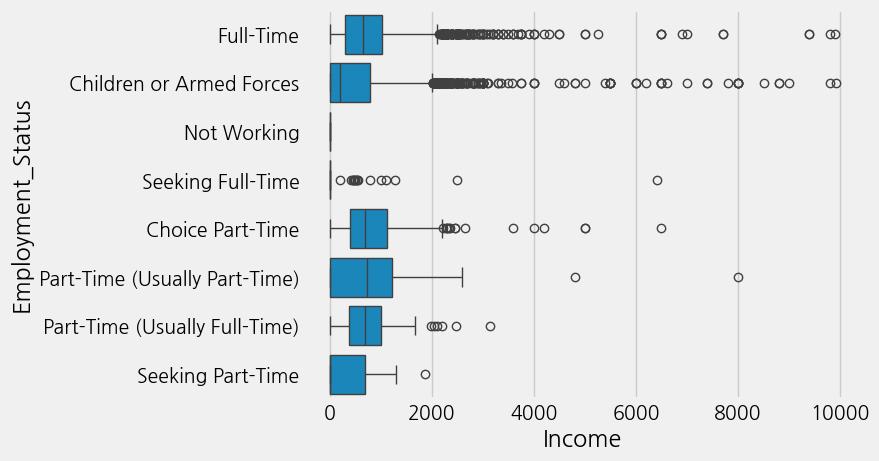

In [ ]:
box_plot('Income', 'Employment_Status')

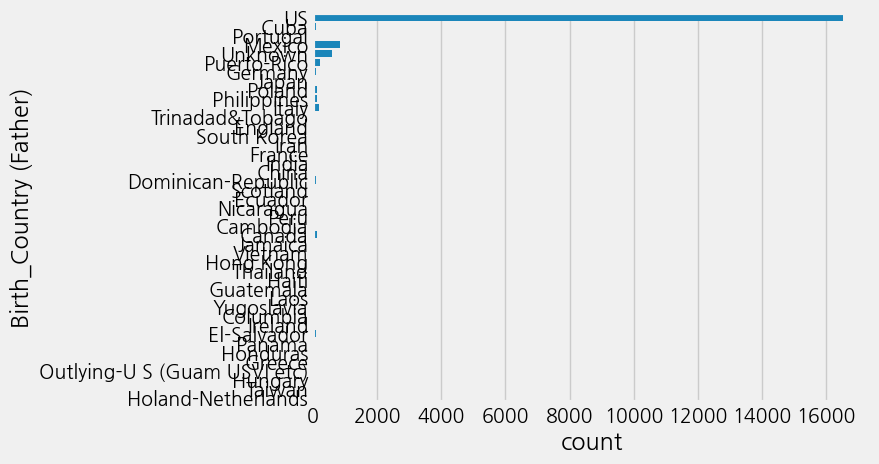

In [ ]:
count_plot('Birth_Country (Father)') # Binary Encoding

In [ ]:
ori_train['Birth_Country (Father)'] = ori_train['Birth_Country (Father)'].where(ori_train['Birth_Country (Father)'] == 'US', 0)
ori_train['Birth_Country (Father)'] = ori_train['Birth_Country (Father)'].where(ori_train['Birth_Country (Father)'] != 'US', 1)

ori_test['Birth_Country (Father)'] = ori_test['Birth_Country (Father)'].where(ori_test['Birth_Country (Father)'] == 'US', 0)
ori_test['Birth_Country (Father)'] = ori_test['Birth_Country (Father)'].where(ori_test['Birth_Country (Father)'] != 'US', 1)

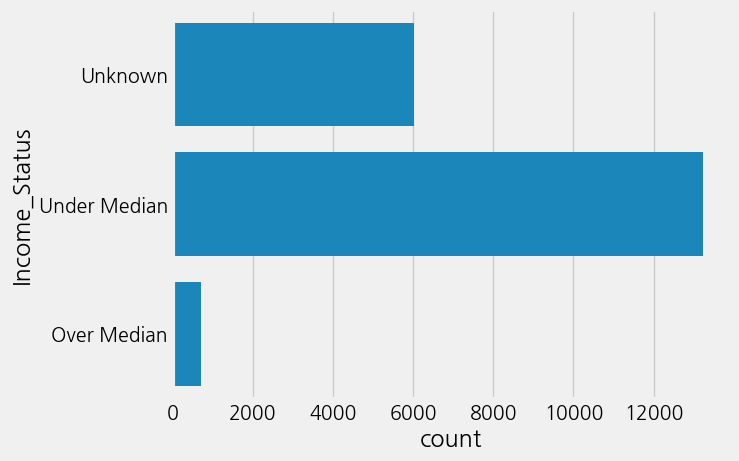

In [ ]:
count_plot('Income_Status') # Onehot Encoding

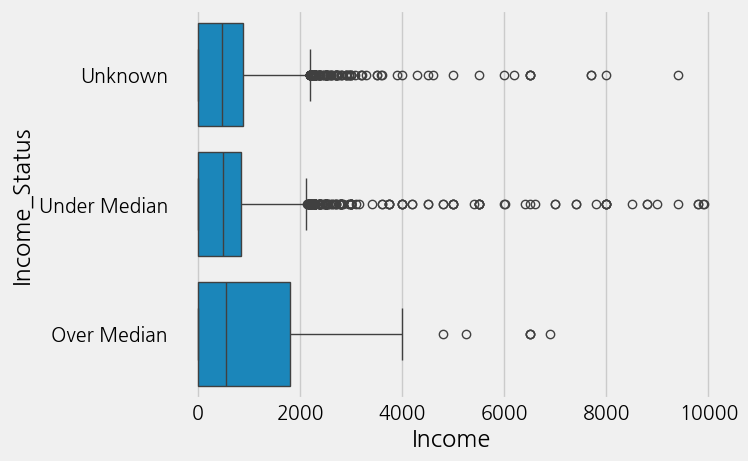

In [ ]:
box_plot('Income', 'Income_Status')

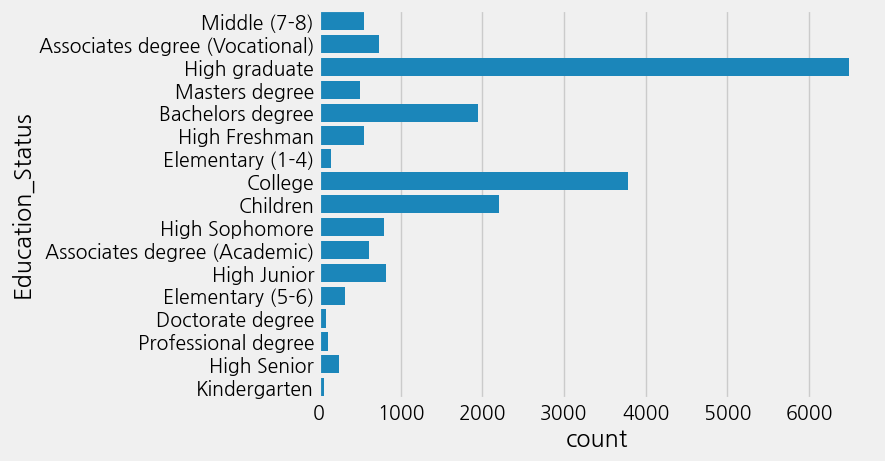

In [ ]:
count_plot('Education_Status') # Binary Encoding

In [ ]:
ori_train['Education_Status'].value_counts().sort_index()

Education_Status
Associates degree (Academic)       608
Associates degree (Vocational)     741
Bachelors degree                  1948
Children                          2208
College                           3787
Doctorate degree                    83
Elementary (1-4)                   150
Elementary (5-6)                   316
High Freshman                      554
High Junior                        819
High Senior                        242
High Sophomore                     798
High graduate                     6492
Kindergarten                        64
Masters degree                     503
Middle (7-8)                       548
Professional degree                106
Name: count, dtype: int64

In [ ]:
ori_test['Education_Status'].value_counts().sort_index()

Education_Status
Associates degree (Academic)       284
Associates degree (Vocational)     381
Bachelors degree                  1041
Children                          1033
College                           1935
Doctorate degree                    41
Elementary (1-4)                    79
Elementary (5-6)                   139
High Freshman                      284
High Junior                        431
High Senior                        117
High Sophomore                     416
High graduate                     3173
Kindergarten                        32
Masters degree                     237
Middle (7-8)                       303
Professional degree                 74
Name: count, dtype: int64

In [ ]:
ori_train['Education_Status'] = ori_train['Education_Status'].where(ori_train['Education_Status'] != 'Elementary (1-4)', 'Elementary')
ori_train['Education_Status'] = ori_train['Education_Status'].where(ori_train['Education_Status'] != 'Elementary (5-6)', 'Elementary')

ori_train['Education_Status'] = ori_train['Education_Status'].where(ori_train['Education_Status'] != 'High Freshman', 'High school')
ori_train['Education_Status'] = ori_train['Education_Status'].where(ori_train['Education_Status'] != 'High Junior', 'High school')
ori_train['Education_Status'] = ori_train['Education_Status'].where(ori_train['Education_Status'] != 'High Senior', 'High school')
ori_train['Education_Status'] = ori_train['Education_Status'].where(ori_train['Education_Status'] != 'High Sophomore', 'High school')

ori_test['Education_Status'] = ori_test['Education_Status'].where(ori_test['Education_Status'] != 'Elementary (1-4)', 'Elementary')
ori_test['Education_Status'] = ori_test['Education_Status'].where(ori_test['Education_Status'] != 'Elementary (5-6)', 'Elementary')

ori_test['Education_Status'] = ori_test['Education_Status'].where(ori_test['Education_Status'] != 'High Freshman', 'High school')
ori_test['Education_Status'] = ori_test['Education_Status'].where(ori_test['Education_Status'] != 'High Junior', 'High school')
ori_test['Education_Status'] = ori_test['Education_Status'].where(ori_test['Education_Status'] != 'High Senior', 'High school')
ori_test['Education_Status'] = ori_test['Education_Status'].where(ori_test['Education_Status'] != 'High Sophomore', 'High school')

associate's degree - 전문학사<br>
High graduate - 고등학교 졸업<br>
Master degree - 석사
Bachelors degree - 학사
Collge


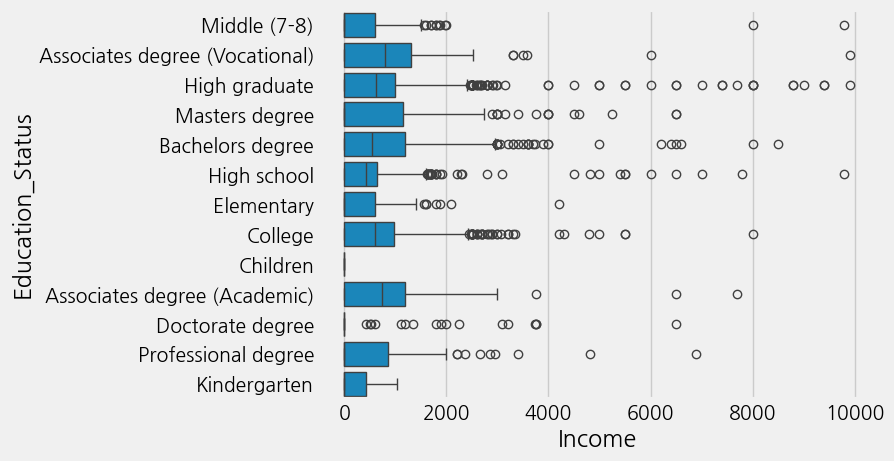

In [ ]:
box_plot('Income', 'Education_Status')

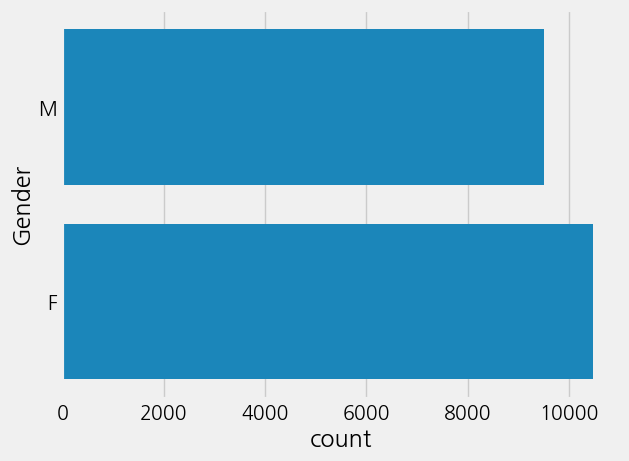

In [ ]:
count_plot('Gender') # Onehot Encoding

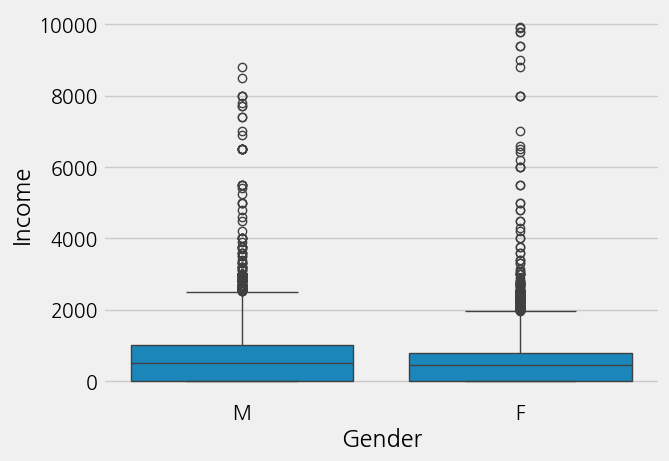

In [ ]:
box_plot('Gender', 'Income')

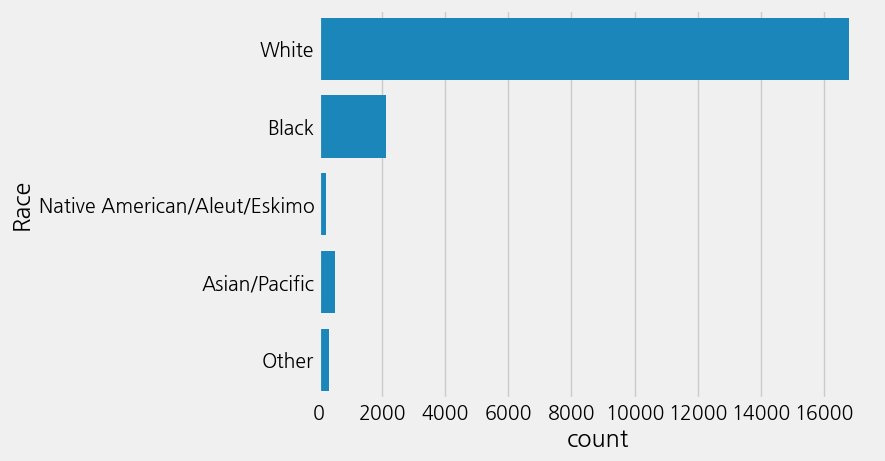

In [ ]:
count_plot('Race') # Onehot Encoding

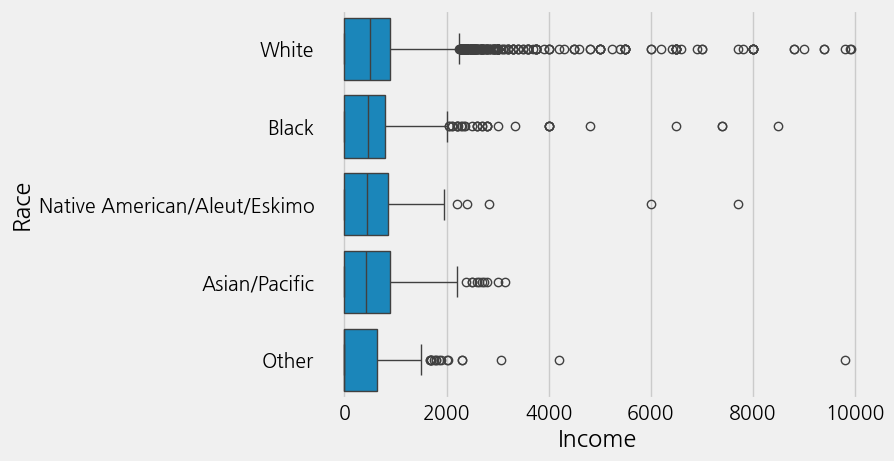

In [ ]:
box_plot('Income', 'Race')

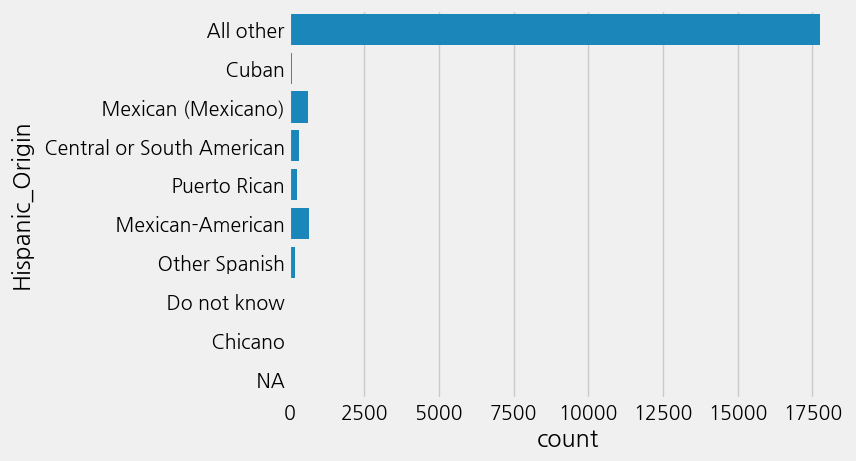

In [ ]:
count_plot('Hispanic_Origin') # One Hot

In [ ]:
ori_train['Hispanic_Origin'].value_counts().sort_index()

Hispanic_Origin
 All other                    17741
 Central or South American      322
 Chicano                         27
 Cuban                           76
 Do not know                     22
 Mexican (Mexicano)             623
 Mexican-American               653
 NA                              59
 Other Spanish                  201
 Puerto Rican                   243
Name: count, dtype: int64

In [ ]:
ori_train['Hispanic_Origin'] = ori_train['Hispanic_Origin'].where(ori_train['Hispanic_Origin'] == ' All other', 0)
ori_train['Hispanic_Origin'] = ori_train['Hispanic_Origin'].where(ori_train['Hispanic_Origin'] != ' All other', 1)

ori_test['Hispanic_Origin'] = ori_test['Hispanic_Origin'].where(ori_test['Hispanic_Origin'] == ' All other', 0)
ori_test['Hispanic_Origin'] = ori_test['Hispanic_Origin'].where(ori_test['Hispanic_Origin'] != ' All other', 1)

In [ ]:
ori_train['Hispanic_Origin'].value_counts()

Hispanic_Origin
1    17741
0     2226
Name: count, dtype: int64

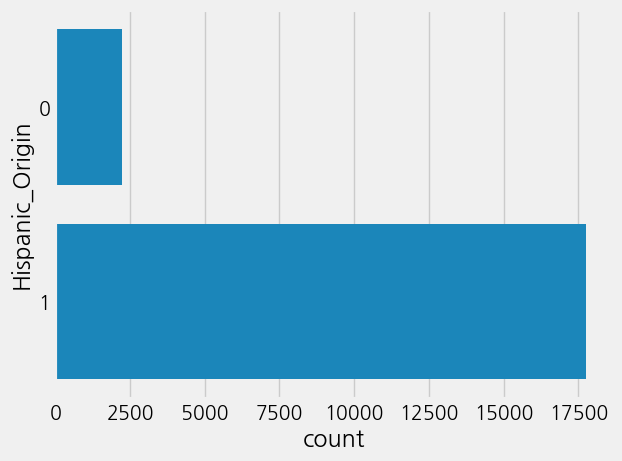

In [ ]:
count_plot('Hispanic_Origin') # OneHot Encoding

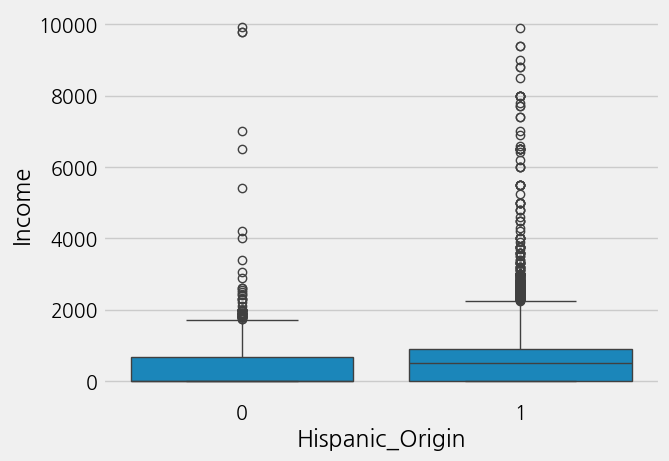

In [ ]:
box_plot('Hispanic_Origin', 'Income')

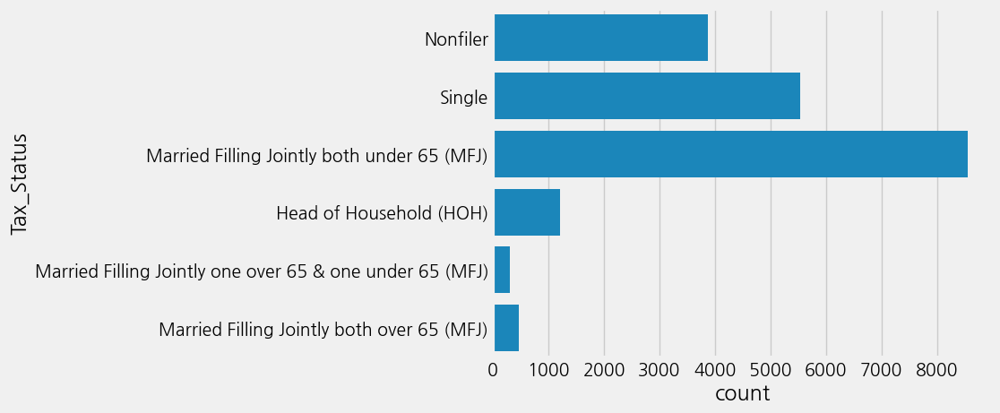

In [ ]:
count_plot('Tax_Status') # OneHot Encoding

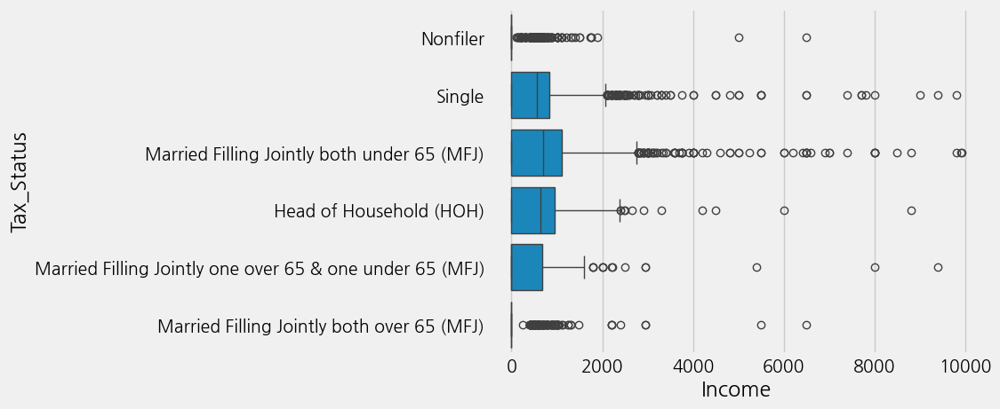

In [ ]:
box_plot('Income', 'Tax_Status')

In [ ]:
ori_train['Tax_Status'].value_counts().sort_index()

Tax_Status
Head of Household (HOH)                                     1214
Married Filling Jointly both over 65 (MFJ)                   469
Married Filling Jointly both under 65 (MFJ)                 8564
Married Filling Jointly one over 65 & one under 65 (MFJ)     305
Nonfiler                                                    3874
Single                                                      5541
Name: count, dtype: int64

## 3-4) Train_test_split

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
y = ori_train['Income']
X = ori_train.drop(['Income'], axis=1)

In [ ]:
X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.3, random_state=args.random_state)

X_tr.shape, X_te.shape, y_tr.shape, y_te.shape

((13976, 21), (5991, 21), (13976,), (5991,))

In [ ]:
train = X_tr.copy()
test = X_te.copy()
ori_te = ori_test.copy()

train.shape, test.shape, ori_te.shape

((13976, 21), (5991, 21), (10000, 21))

## 3-5) Data Preprocessing

In [ ]:
# train set 정보 확인
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13976 entries, 11360 to 7832
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     13976 non-null  int64 
 1   Gender                  13976 non-null  object
 2   Education_Status        13976 non-null  object
 3   Employment_Status       13976 non-null  object
 4   Working_Week (Yearly)   13976 non-null  int64 
 5   Industry_Status         13976 non-null  object
 6   Occupation_Status       13976 non-null  object
 7   Race                    13976 non-null  object
 8   Hispanic_Origin         13976 non-null  object
 9   Martial_Status          13976 non-null  object
 10  Household_Status        13976 non-null  object
 11  Household_Summary       13976 non-null  object
 12  Citizenship             13976 non-null  object
 13  Birth_Country           13976 non-null  object
 14  Birth_Country (Father)  13976 non-null  object
 15  Birt

In [ ]:
# # drop columns
# print(f'before: {train.shape} / {test.shape}')
# drop_cols = ['ticket']

# train.drop(drop_cols, axis=1, inplace=True)
# test.drop(drop_cols, axis=1, inplace=True)
# ori_te.drop(drop_cols, axis=1, inplace=True)

# print(f'after: {train.shape} / {test.shape}')
# train.info()

In [ ]:
train.isnull().sum()

Age                       0
Gender                    0
Education_Status          0
Employment_Status         0
Working_Week (Yearly)     0
Industry_Status           0
Occupation_Status         0
Race                      0
Hispanic_Origin           0
Martial_Status            0
Household_Status          0
Household_Summary         0
Citizenship               0
Birth_Country             0
Birth_Country (Father)    0
Birth_Country (Mother)    0
Tax_Status                0
Gains                     0
Losses                    0
Dividends                 0
Income_Status             0
dtype: int64

In [ ]:
test.isnull().sum()

Age                       0
Gender                    0
Education_Status          0
Employment_Status         0
Working_Week (Yearly)     0
Industry_Status           0
Occupation_Status         0
Race                      0
Hispanic_Origin           0
Martial_Status            0
Household_Status          0
Household_Summary         0
Citizenship               0
Birth_Country             0
Birth_Country (Father)    0
Birth_Country (Mother)    0
Tax_Status                0
Gains                     0
Losses                    0
Dividends                 0
Income_Status             0
dtype: int64

In [ ]:
ori_te.isnull().sum()

Age                       0
Gender                    0
Education_Status          0
Employment_Status         0
Working_Week (Yearly)     0
Industry_Status           0
Occupation_Status         0
Race                      0
Hispanic_Origin           0
Martial_Status            0
Household_Status          1
Household_Summary         0
Citizenship               0
Birth_Country             0
Birth_Country (Father)    0
Birth_Country (Mother)    0
Tax_Status                0
Gains                     0
Losses                    0
Dividends                 0
Income_Status             0
dtype: int64

In [ ]:
train.columns

Index(['Age', 'Gender', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race',
       'Hispanic_Origin', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Birth_Country',
       'Birth_Country (Father)', 'Birth_Country (Mother)', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status'],
      dtype='object')

In [ ]:
# 컬럼 선택
train = train[['Age', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status']]

test = test[['Age', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status']]

ori_te = ori_te[['Age', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race', 'Martial_Status', 'Household_Status',
       'Household_Summary', 'Citizenship', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status']]

## 3-6) Data Encoding

In [ ]:
# Onehot - Citizenship, Martial_Status, Household_Summary, Employment_Status, Income_Status, Race, Tax_Status
# Binary - 'Household_Status', 'Education_Status', 'Industry_Status', 'Occupation_Status'

In [ ]:
# Select object columns
encoding_target = list(train.dtypes[train.dtypes == "object"].index)

# Apply one-hot encoding
train = pd.get_dummies(train, columns=encoding_target, dtype = "int")
test = pd.get_dummies(test, columns=encoding_target, dtype = "int")
ori_te = pd.get_dummies(ori_te, columns=encoding_target, dtype = "int")

# Align train and test data to ensure they have the same columns
train, test = train.align(test, join='left', axis=1)
train, ori_te = train.align(ori_te, join='left', axis=1)

# Fill NaN values (if any) with 0
test.fillna(0, inplace=True)
ori_te.fillna(0, inplace=True)

In [ ]:
from sklearn.preprocessing import OneHotEncoder

#### OnehotEncoding

In [ ]:
train.columns

Index(['Age', 'Working_Week (Yearly)', 'Gains', 'Losses', 'Dividends',
       'Education_Status_Associates degree (Academic)',
       'Education_Status_Associates degree (Vocational)',
       'Education_Status_Bachelors degree', 'Education_Status_Children',
       'Education_Status_College',
       ...
       'Citizenship_Native (Born in Puerto Rico or US Outlying)',
       'Tax_Status_Head of Household (HOH)',
       'Tax_Status_Married Filling Jointly both over 65 (MFJ)',
       'Tax_Status_Married Filling Jointly both under 65 (MFJ)',
       'Tax_Status_Married Filling Jointly one over 65 & one under 65 (MFJ)',
       'Tax_Status_Nonfiler', 'Tax_Status_Single', 'Income_Status_Over Median',
       'Income_Status_Under Median', 'Income_Status_Unknown'],
      dtype='object', length=117)

In [ ]:
# test.columns

In [ ]:
# 다 때려 넣어
enc_cols = list(train.dtypes[train.dtypes == "object"].index)

normal_cols = list(set(train.columns) - set(enc_cols))
normal_cols

['Tax_Status_Nonfiler',
 'Education_Status_Associates degree (Vocational)',
 'Household_Summary_Child 18 or older',
 'Industry_Status_Entertainment',
 'Citizenship_Foreign-born (Non-US Citizen)',
 'Industry_Status_Manufacturing (Durable)',
 'Industry_Status_Business & Repair',
 'Industry_Status_Private Household Services',
 'Martial_Status_Separated',
 'Household_Status_In group quarters',
 'Employment_Status_Choice Part-Time',
 'Industry_Status_Education',
 'Occupation_Status_Management',
 'Industry_Status_Forestry & Fisheries',
 'Industry_Status_Utilities & Sanitary',
 'Household_Status_Child <18 never marr not in subfamily',
 'Education_Status_Associates degree (Academic)',
 'Martial_Status_Married (Spouse Absent)',
 'Gains',
 'Occupation_Status_Craft & Repair',
 'Industry_Status_Agriculture',
 'Citizenship_Native (Born Abroad)',
 'Occupation_Status_Services',
 'Income_Status_Under Median',
 'Industry_Status_Social Services',
 'Employment_Status_Full-Time',
 'Employment_Status_Part-

In [ ]:
enc_cols = ['Citizenship', 'Martial_Status', 'Household_Summary', 'Employment_Status', 'Income_Status', 'Race', 'Tax_Status']
normal_cols = list(set(train.columns) - set(enc_cols))
normal_cols

['Education_Status',
 'Household_Status',
 'Occupation_Status',
 'Industry_Status',
 'Gains',
 'Losses',
 'Dividends',
 'Age',
 'Working_Week (Yearly)']

In [ ]:
print(f'before: {train.shape} / {test.shape} / {ori_te.shape}')

enc = OneHotEncoder()
# train
tmp_tr = pd.DataFrame(
    enc.fit_transform(train[enc_cols]).toarray(),
    columns = enc.get_feature_names_out()
)
enc_tr = pd.concat(
    [train[normal_cols].reset_index(drop=True), tmp_tr.reset_index(drop=True)]
    , axis=1
)
# test
tmp_te = pd.DataFrame(
    enc.fit_transform(test[enc_cols]).toarray(),
    columns = enc.get_feature_names_out()
)
enc_te = pd.concat(
    [test[normal_cols].reset_index(drop=True), tmp_te.reset_index(drop=True)]
    , axis=1
)
# ori_test
tmp_ori_te = pd.DataFrame(
    enc.fit_transform(ori_te[enc_cols]).toarray(),
    columns = enc.get_feature_names_out()
)
enc_ori_te = pd.concat(
    [ori_te[normal_cols].reset_index(drop=True), tmp_ori_te.reset_index(drop=True)]
    , axis=1
)

print(f'after: {enc_tr.shape} / {enc_te.shape} / {enc_ori_te.shape}')
enc_tr.head()

before: (15973, 117) / (3994, 117) / (10000, 117)
after: (15973, 117) / (3994, 117) / (10000, 117)


,Tax_Status_Nonfiler,Education_Status_Associates degree (Vocational),Household_Summary_Child 18 or older,Industry_Status_Entertainment,Citizenship_Foreign-born (Non-US Citizen),Industry_Status_Manufacturing (Durable),Industry_Status_Business & Repair,Industry_Status_Private Household Services,Martial_Status_Separated,Household_Status_In group quarters,Employment_Status_Choice Part-Time,...,Race_White,Household_Status_Householder,Martial_Status_Married (Armed Force Spouse),Household_Status_Child 18+ never married Responsible Person of subfamily,Industry_Status_Hospitals,Education_Status_High graduate,Household_Status_Grandchild <18 never married child of subfamily Responsible Person,Tax_Status_Married Filling Jointly both under 65 (MFJ),Citizenship_Native,Occupation_Status_Handlers/Cleaners,Education_Status_Elementary
0,False,False,False,False,True,True,False,False,False,False,False,...,False,False,False,False,False,True,False,True,False,False,False
1,True,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,True,False,False
2,False,False,False,False,False,False,False,False,False,False,False,...,True,True,False,False,False,False,False,True,True,False,False
3,False,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,True,False,True,True,False,False
4,True,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,True,False,False


#### BinaryEncoder

In [ ]:
# Onehot - Citizenship, Martial_Status, Household_Summary, Employment_Status, Income_Status, Race, Tax_Status
# Binary - 'Household_Status', 'Education_Status', 'Industry_Status', 'Occupation_Status'

In [ ]:
pip install category_encoders

In [ ]:
from category_encoders.binary import BinaryEncoder

In [ ]:
train['Household_Summary'].value_counts().sort_index()

Household_Summary
Child 18 or older                       1741
Child under 18 never married            2166
Group Quarters- Secondary individual      17
Householder                             6826
Nonrelative of householder               776
Other relative of householder            617
Spouse of householder                   3830
Name: count, dtype: int64

In [ ]:
test['Household_Summary'].value_counts().sort_index()

Household_Summary
Child 18 or older                        450
Child under 18 never married             517
Group Quarters- Secondary individual       7
Householder                             1696
Nonrelative of householder               198
Other relative of householder            162
Spouse of householder                    964
Name: count, dtype: int64

In [ ]:
enc_tr.columns

Index(['Education_Status', 'Household_Status', 'Occupation_Status',
       'Industry_Status', 'Gains', 'Losses', 'Dividends', 'Age',
       'Working_Week (Yearly)',
       'Citizenship_Foreign-born (Naturalized US Citizen)',
       'Citizenship_Foreign-born (Non-US Citizen)', 'Citizenship_Native',
       'Citizenship_Native (Born Abroad)',
       'Citizenship_Native (Born in Puerto Rico or US Outlying)',
       'Martial_Status_Divorced', 'Martial_Status_Married',
       'Martial_Status_Married (Armed Force Spouse)',
       'Martial_Status_Married (Spouse Absent)', 'Martial_Status_Separated',
       'Martial_Status_Single', 'Martial_Status_Widowed',
       'Household_Summary_Child 18 or older',
       'Household_Summary_Child under 18 never married',
       'Household_Summary_Group Quarters- Secondary individual',
       'Household_Summary_Householder',
       'Household_Summary_Nonrelative of householder',
       'Household_Summary_Other relative of householder',
       'Household_Summ

In [ ]:
# Binary - 'Household_Status', 'Education_Status', 'Industry_Status', 'Occupation_Status'

In [ ]:
enc_cols = ['Household_Status', 'Education_Status', 'Industry_Status', 'Occupation_Status']
normal_cols = list(set(enc_tr.columns) - set(enc_cols))
normal_cols

['Martial_Status_Divorced',
 'Race_Other',
 'Martial_Status_Widowed',
 'Employment_Status_Part-Time (Usually Full-Time)',
 'Race_Black',
 'Race_Native American/Aleut/Eskimo',
 'Employment_Status_Seeking Full-Time',
 'Household_Summary_Nonrelative of householder',
 'Citizenship_Native (Born in Puerto Rico or US Outlying)',
 'Martial_Status_Single',
 'Household_Summary_Other relative of householder',
 'Tax_Status_Single',
 'Employment_Status_Seeking Part-Time',
 'Employment_Status_Not Working',
 'Martial_Status_Married',
 'Age',
 'Working_Week (Yearly)',
 'Employment_Status_Part-Time (Usually Part-Time)',
 'Household_Summary_Spouse of householder',
 'Race_Asian/Pacific',
 'Tax_Status_Head of Household (HOH)',
 'Household_Summary_Child under 18 never married',
 'Citizenship_Foreign-born (Non-US Citizen)',
 'Household_Summary_Child 18 or older',
 'Tax_Status_Nonfiler',
 'Martial_Status_Married (Spouse Absent)',
 'Employment_Status_Full-Time',
 'Tax_Status_Married Filling Jointly both under

In [ ]:
print(f'before: {enc_tr.shape} / {enc_te.shape} / {enc_ori_te.shape}')

enc = BinaryEncoder()
# train
tmp_tr = pd.DataFrame(
    enc.fit_transform(enc_tr[enc_cols]),
    columns = enc.get_feature_names_out()
)
enc_tr = pd.concat(
    [enc_tr[normal_cols].reset_index(drop=True), tmp_tr.reset_index(drop=True)]
    , axis=1
)
# test
tmp_te = pd.DataFrame(
    enc.fit_transform(enc_te[enc_cols]),
    columns = enc.get_feature_names_out()
)
enc_te = pd.concat(
    [enc_te[normal_cols].reset_index(drop=True), tmp_te.reset_index(drop=True)]
    , axis=1
)
# ori_test
tmp_ori_te = pd.DataFrame(
    enc.fit_transform(enc_ori_te[enc_cols]),
    columns = enc.get_feature_names_out()
)
enc_ori_te = pd.concat(
    [enc_ori_te[normal_cols].reset_index(drop=True), tmp_ori_te.reset_index(drop=True)]
    , axis=1
)

print(f'after: {enc_tr.shape} / {enc_te.shape} / {enc_ori_te.shape}')
enc_tr.head()

before: (15973, 50) / (3994, 50) / (10000, 51)
after: (15973, 64) / (3994, 64) / (10000, 64)


,Martial_Status_Divorced,Race_Other,Martial_Status_Widowed,Employment_Status_Part-Time (Usually Full-Time),Race_Black,Race_Native American/Aleut/Eskimo,Employment_Status_Seeking Full-Time,Household_Summary_Nonrelative of householder,Citizenship_Native (Born in Puerto Rico or US Outlying),Martial_Status_Single,Household_Summary_Other relative of householder,...,Education_Status_2,Education_Status_3,Industry_Status_0,Industry_Status_1,Industry_Status_2,Industry_Status_3,Industry_Status_4,Occupation_Status_0,Occupation_Status_1,Occupation_Status_2,Occupation_Status_3
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,1,0,0,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1,0,0,0,0,1,0,0,0,1,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,1,0,0,0,1,1,0,0,1,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,1,0,0,0,1,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,1,0,0,0,1,0,0


## 3-7) Data  Scaling

In [ ]:
enc_tr.isnull().sum().sum(), enc_te.isnull().sum().sum(), enc_ori_te.isnull().sum().sum()

NameError: name 'enc_tr' is not defined

In [ ]:
enc_tr.columns

NameError: name 'enc_tr' is not defined

In [ ]:
enc_te.columns

Index(['Martial_Status_Divorced', 'Race_Other', 'Martial_Status_Widowed',
       'Employment_Status_Part-Time (Usually Full-Time)', 'Race_Black',
       'Race_Native American/Aleut/Eskimo',
       'Employment_Status_Seeking Full-Time',
       'Household_Summary_Nonrelative of householder',
       'Citizenship_Native (Born in Puerto Rico or US Outlying)',
       'Martial_Status_Single',
       'Household_Summary_Other relative of householder', 'Tax_Status_Single',
       'Employment_Status_Seeking Part-Time', 'Employment_Status_Not Working',
       'Martial_Status_Married', 'Age', 'Working_Week (Yearly)',
       'Employment_Status_Part-Time (Usually Part-Time)',
       'Household_Summary_Spouse of householder', 'Race_Asian/Pacific',
       'Tax_Status_Head of Household (HOH)',
       'Household_Summary_Child under 18 never married',
       'Citizenship_Foreign-born (Non-US Citizen)',
       'Household_Summary_Child 18 or older', 'Tax_Status_Nonfiler',
       'Martial_Status_Married (Spo

In [ ]:
enc_ori_te.columns

Index(['Martial_Status_Divorced', 'Race_Other', 'Martial_Status_Widowed',
       'Employment_Status_Part-Time (Usually Full-Time)', 'Race_Black',
       'Race_Native American/Aleut/Eskimo',
       'Employment_Status_Seeking Full-Time',
       'Household_Summary_Nonrelative of householder',
       'Citizenship_Native (Born in Puerto Rico or US Outlying)',
       'Martial_Status_Single',
       'Household_Summary_Other relative of householder', 'Tax_Status_Single',
       'Employment_Status_Seeking Part-Time', 'Employment_Status_Not Working',
       'Martial_Status_Married', 'Age', 'Working_Week (Yearly)',
       'Employment_Status_Part-Time (Usually Part-Time)',
       'Household_Summary_Spouse of householder', 'Race_Asian/Pacific',
       'Tax_Status_Head of Household (HOH)',
       'Household_Summary_Child under 18 never married',
       'Citizenship_Foreign-born (Non-US Citizen)',
       'Household_Summary_Child 18 or older', 'Tax_Status_Nonfiler',
       'Martial_Status_Married (Spo

### Robust scaling

In [ ]:
# min-max sciling - Working_Week (Yearly)
# robust scailing - Losses, Gains, Dividends

In [ ]:
scaling_cols = ['Gains', 'Dividends', 'Losses']
not_scaling_cols = list(set(train.columns) - set(scaling_cols))
not_scaling_cols

['Occupation_Status_Management',
 'Education_Status_Middle (7-8)',
 'Industry_Status_Construction',
 'Household_Summary_Child under 18 never married',
 'Birth_Country (Mother)_Germany',
 'Education_Status_Associates degree (Vocational)',
 'Birth_Country (Father)_Trinadad&Tobago',
 'Tax_Status_Nonfiler',
 'Birth_Country (Father)_Canada',
 'Birth_Country (Father)_US',
 'Birth_Country_Iran',
 'Education_Status_High graduate',
 'Education_Status_College',
 'Birth_Country (Mother)_Ireland',
 'Birth_Country_Holand-Netherlands',
 'Birth_Country_Mexico',
 'Industry_Status_Wholesale',
 'Working_Week (Yearly)',
 'Birth_Country (Father)_Dominican-Republic',
 'Income_Status_Unknown',
 'Birth_Country (Father)_Unknown',
 'Birth_Country (Mother)_Philippines',
 'Birth_Country (Mother)_Thailand',
 'Birth_Country_Canada',
 'Birth_Country_Ecuador',
 'Birth_Country (Mother)_Nicaragua',
 'Birth_Country (Mother)_Vietnam',
 'Hispanic_Origin_ Mexican-American',
 'Industry_Status_Medical (except Hospitals)',
 

In [ ]:
scaling_cols = ['Gains', 'Dividends', 'Losses']
not_scaling_cols = list(set(enc_tr.columns) - set(scaling_cols))
not_scaling_cols

['Income_Status_Unknown',
 'Occupation_Status_Admin Support (include Clerical)',
 'Household_Status_Spouse of Responsible Person of unrelated subfamily',
 'Birth_Country_Holand-Netherlands',
 'Education_Status_Doctorate degree',
 'Race_Native American/Aleut/Eskimo',
 'Race_White',
 'Industry_Status_Finance Insurance & Real Estate',
 'Household_Status_Other Rel <18 never marr not in subfamily',
 'Industry_Status_Utilities & Sanitary',
 'Birth_Country_Thailand',
 'Industry_Status_Mining',
 'Birth_Country_Nicaragua',
 'Industry_Status_Personal Services (except Private Household)',
 'Birth_Country_Cambodia',
 'Hispanic_Origin_ Puerto Rican',
 'Industry_Status_Private Household Services',
 'Industry_Status_Social Services',
 'Industry_Status_Agriculture',
 'Employment_Status_Children or Armed Forces',
 'Household_Status_Other Relative <18 never married child of subfamily Responsible Person',
 'Industry_Status_Not in universe or children',
 'Martial_Status_Married',
 'Occupation_Status_Priva

In [ ]:
from sklearn.preprocessing import RobustScaler

In [ ]:
scaler = RobustScaler()

_scaled_tr = scaler.fit_transform(train[scaling_cols])
_scaled_te = scaler.transform(test[scaling_cols])
_scaled__ori_te = scaler.transform(ori_te[scaling_cols])

In [ ]:
scaler = RobustScaler()

_scaled_tr = scaler.fit_transform(enc_tr[scaling_cols])
_scaled_te = scaler.transform(enc_te[scaling_cols])
_scaled__ori_te = scaler.transform(enc_ori_te[scaling_cols])

NameError: name 'enc_tr' is not defined

In [ ]:
scaling_cols = ['Gains', 'Dividends', 'Losses']
scaler = RobustScaler()
scaled_dfs = []

for i, df in enumerate([train, test, ori_te]):
  if not i:
    _scaled = scaler.fit_transform(df[scaling_cols])
  else:
    _scaled = scaler.transform(df[scaling_cols])

  _scaled_df = pd.DataFrame(
    _scaled,
    columns = scaling_cols
  )

  not_scaling_cols = list(set(df.columns) - set(scaling_cols))

  scaled_dfs.append(
    pd.concat(
      [df[not_scaling_cols].reset_index(drop=True), _scaled_df.reset_index(drop=True)]
      , axis=1
    ).reset_index(drop=True)
  )

enc_tr = scaled_dfs[0]
enc_te = scaled_dfs[1]
enc_ori_te = scaled_dfs[2]

print(f'{enc_tr.isnull().sum().sum()} / {enc_te.isnull().sum().sum()} / {enc_ori_te.isnull().sum().sum()}')
enc_tr.shape, enc_te.shape, enc_ori_te.shape

0 / 0 / 0


((13976, 260), (5991, 260), (10000, 260))

In [ ]:
scaling_cols = ['Gains', 'Dividends', 'Losses']
scaler = RobustScaler()
scaled_dfs = []

for i, df in enumerate([enc_tr, enc_te, enc_ori_te]):
  if not i:
    _scaled = scaler.fit_transform(df[scaling_cols])
  else:
    _scaled = scaler.transform(df[scaling_cols])

  _scaled_df = pd.DataFrame(
    _scaled,
    columns = scaling_cols
  )

  not_scaling_cols = list(set(df.columns) - set(scaling_cols))

  scaled_dfs.append(
    pd.concat(
      [df[not_scaling_cols].reset_index(drop=True), _scaled_df.reset_index(drop=True)]
      , axis=1
    ).reset_index(drop=True)
  )

enc_tr = scaled_dfs[0]
enc_te = scaled_dfs[1]
enc_ori_te = scaled_dfs[2]

print(f'{enc_tr.isnull().sum().sum()} / {enc_te.isnull().sum().sum()} / {enc_ori_te.isnull().sum().sum()}')
enc_tr.shape, enc_te.shape, enc_ori_te.shape

0 / 0 / 0


((15973, 170), (3994, 168), (10000, 173))

In [ ]:
enc_tr.isnull().sum().sum(), enc_te.isnull().sum().sum(), enc_ori_te.isnull().sum().sum()

(0, 0, 0)

In [ ]:
enc_tr.columns

Index(['Household_Summary_Child 18 or older', 'Gender_F',
       'Education_Status_Kindergarten', 'Hispanic_Origin_0',
       'Industry_Status_Entertainment',
       'Industry_Status_Manufacturing (Durable)',
       'Household_Summary_Householder',
       'Citizenship_Foreign-born (Naturalized US Citizen)',
       'Household_Summary_Other relative of householder',
       'Education_Status_College',
       ...
       'Birth_Country (Mother)_0', 'Industry_Status_Public Administration',
       'Industry_Status_Mining', 'Race_Asian/Pacific', 'Working_Week (Yearly)',
       'Education_Status_Bachelors degree',
       'Citizenship_Foreign-born (Non-US Citizen)', 'Gains', 'Dividends',
       'Losses'],
      dtype='object', length=127)

In [ ]:
enc_tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15973 entries, 0 to 15972
Columns: 127 entries, Household_Summary_Child 18 or older to Losses
dtypes: float64(3), int64(124)
memory usage: 15.5 MB


### minmax scaling

In [ ]:
# min-max sciling - Working_Week (Yearly)
# robust scailing - Losses, Gains, Dividends

In [ ]:
scaling_cols = ['Working_Week (Yearly)']
not_scaling_cols = list(set(enc_tr.columns) - set(scaling_cols))
not_scaling_cols

['Occupation_Status_Management',
 'Education_Status_Middle (7-8)',
 'Household_Summary_Child under 18 never married',
 'Industry_Status_Construction',
 'Birth_Country (Mother)_Germany',
 'Education_Status_Associates degree (Vocational)',
 'Birth_Country (Father)_Trinadad&Tobago',
 'Tax_Status_Nonfiler',
 'Birth_Country (Father)_Canada',
 'Birth_Country (Father)_US',
 'Birth_Country_Iran',
 'Education_Status_College',
 'Education_Status_High graduate',
 'Birth_Country (Mother)_Ireland',
 'Birth_Country_Holand-Netherlands',
 'Birth_Country_Mexico',
 'Industry_Status_Wholesale',
 'Birth_Country (Father)_Dominican-Republic',
 'Income_Status_Unknown',
 'Birth_Country (Father)_Unknown',
 'Birth_Country (Mother)_Philippines',
 'Birth_Country (Mother)_Thailand',
 'Birth_Country_Canada',
 'Gains',
 'Birth_Country_Ecuador',
 'Birth_Country (Mother)_Nicaragua',
 'Birth_Country (Mother)_Vietnam',
 'Hispanic_Origin_ Mexican-American',
 'Industry_Status_Medical (except Hospitals)',
 'Education_Statu

In [ ]:
scaling_cols = ['Working_Week (Yearly)']
not_scaling_cols = list(set(enc_tr.columns) - set(scaling_cols))
not_scaling_cols

['Household_Summary_Householder',
 'Income_Status_Under Median',
 'Household_Status_Other Rel <18 never marr not in subfamily',
 'Occupation_Status_Farming & Forestry & Fishing',
 'Age',
 'Occupation_Status_Transportation',
 'Income_Status_Unknown',
 'Martial_Status_Separated',
 'Education_Status_Masters degree',
 'Household_Status_Secondary individual',
 'Household_Status_Spouse of Responsible Person of unrelated subfamily',
 'Industry_Status_Mining',
 'Household_Summary_Other relative of householder',
 'Martial_Status_Married (Armed Force Spouse)',
 'Household_Status_Child 18+ spouse of subfamily Responsible Person',
 'Occupation_Status_Craft & Repair',
 'Household_Status_Householder',
 'Employment_Status_Part-Time (Usually Full-Time)',
 'Education_Status_Associates degree (Vocational)',
 'Household_Status_Other Rel 18+ never marr not in subfamily',
 'Education_Status_Doctorate degree',
 'Household_Status_Other Relative 18+ spouse of subfamily Responsible Person',
 'Household_Status_

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler = MinMaxScaler()

_scaled_tr = scaler.fit_transform(enc_tr[scaling_cols])
_scaled_te = scaler.transform(enc_te[scaling_cols])
_scaled__ori_te = scaler.transform(enc_ori_te[scaling_cols])

In [ ]:
scaling_cols = ['Working_Week (Yearly)']
scaler = MinMaxScaler()
scaled_dfs = []

for i, df in enumerate([enc_tr, enc_te, enc_ori_te]):
  if not i:
    _scaled = scaler.fit_transform(df[scaling_cols])
  else:
    _scaled = scaler.transform(df[scaling_cols])

  _scaled_df = pd.DataFrame(
    _scaled,
    columns = scaling_cols
  )

  not_scaling_cols = list(set(df.columns) - set(scaling_cols))

  scaled_dfs.append(
    pd.concat(
      [df[not_scaling_cols].reset_index(drop=True), _scaled_df.reset_index(drop=True)]
      , axis=1
    ).reset_index(drop=True)
  )

enc_tr = scaled_dfs[0]
enc_te = scaled_dfs[1]
enc_ori_te = scaled_dfs[2]

print(f'{enc_tr.isnull().sum().sum()} / {enc_te.isnull().sum().sum()} / {enc_ori_te.isnull().sum().sum()}')
enc_tr.shape, enc_te.shape, enc_ori_te.shape

0 / 0 / 0


((13976, 260), (5991, 260), (10000, 260))

In [ ]:
enc_tr.isnull().sum().sum(), enc_te.isnull().sum().sum(), enc_ori_te.isnull().sum().sum()

(0, 0, 0)

## 3-8) 다중공선성 확인

In [ ]:
enc_tr.columns

Index(['Birth_Country (Mother)_Thailand',
       'Household_Status_Responsible Person of unrelated subfamily',
       'Household_Summary_Child under 18 never married', 'Race_Black',
       'Birth_Country (Mother)_England', 'Citizenship_Native',
       'Industry_Status_Other professional services',
       'Education_Status_Associates degree (Vocational)',
       'Birth_Country_Japan', 'Birth_Country_Guatemala',
       ...
       'Birth_Country (Mother)_Guatemala', 'Birth_Country (Father)_Nicaragua',
       'Birth_Country (Father)_Trinadad&Tobago',
       'Birth_Country (Father)_Taiwan', 'Birth_Country_Haiti',
       'Birth_Country_Germany', 'Birth_Country (Mother)_Nicaragua',
       'Education_Status_College',
       'Birth_Country (Father)_Outlying-U S (Guam USVI etc)',
       'Working_Week (Yearly)'],
      dtype='object', length=260)

In [ ]:
# 처음 제거하게 된 경우
enc_tr_s = enc_tr.drop(columns=['Race_Black', 'Tax_Status_Single', 'Citizenship_Native', 'Income_Status_Unknown',
                                'Tax_Status_Head of Household (HOH)', 'Race_Other', 'Citizenship_Native (Born in Puerto Rico or US Outlying)',
                                'Tax_Status_Married Filling Jointly one over 65 & one under 65 (MFJ)', 'Martial_Status_Widowed',
                                'Citizenship_Native (Born Abroad)', 'Household_Summary_Child 18 or older','Tax_Status_Married Filling Jointly both under 65 (MFJ)',
                                'Tax_Status_Nonfiler', 'Employment_Status_Choice Part-Time', 'Employment_Status_Part-Time (Usually Part-Time)', 'Citizenship_Foreign-born (Naturalized US Citizen)',
                                'Martial_Status_Married (Armed Force Spouse)', 'Martial_Status_Separated', 'Martial_Status_Married (Spouse Absent)',
                                'Race_White', 'Race_Asian/Pacific', 'Household_Summary_Other relative of householder', 'Employment_Status_Not Working',
                                'Household_Summary_Householder', 'Income_Status_Under Median', 'Income_Status_Over Median', 'Martial_Status_Married',
                                'Employment_Status_Seeking Full-Time', 'Martial_Status_Divorced', 'Race_Native American/Aleut/Eskimo', 'Household_Summary_Spouse of householder',
                                'Citizenship_Foreign-born (Non-US Citizen)', 'Martial_Status_Single', 'Household_Summary_Nonrelative of householder',
                                'Employment_Status_Children or Armed Forces', 'Household_Summary_Group Quarters- Secondary individual', 'Tax_Status_Married Filling Jointly both over 65 (MFJ)',
                                'Employment_Status_Part-Time (Usually Full-Time)', 'Employment_Status_Seeking Part-Time', 'Household_Summary_Child under 18 never married',
                                'Employment_Status_Full-Time', 'Household_Status_3', 'Household_Status_2'])

In [ ]:
# 2
enc_tr_s2 = enc_tr_s.drop(columns=['Household_Status_3', 'Household_Summary_0', 'Household_Summary_1', 'Employment_Status_2', 'Household_Status_4', 'Race_2', 'Household_Summary_2', 'Income_Status_0'])

In [ ]:
# # 결과확인하며 지우게되는 경우
# train_s = train.drop(columns=['버스정류장수','부동산','버스정류장_거리','총생활인구수','주민등록인구수','소비자물가지수','학교_거리','편의점 수','실거래가격지수','5대범죄(총)','도로율','전세가율','지역내총생산','음식점 수','소비심리지수','전월세전환율','경제활동인구 (천명)','지가지수','거래금액(만원)','법정동_Encoded','전용면적(㎡)','㎡당_평균가격', '전용면적_s', '재건축','브랜드여부','푸르지오', '더샵', 'e편한세상', '위브', '자이','힐스테이트'])

In [ ]:
from tqdm import tqdm

In [ ]:
%%time
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF 계산
vif = pd.DataFrame()
vif['Features'] = enc_tr.columns
vif['VIF'] = [variance_inflation_factor(enc_tr.values, i) for i in tqdm(range(enc_tr.shape[1]))]

# # VIF 결과 출력
# vif

100%|██████████| 117/117 [01:23<00:00,  1.41it/s]

CPU times: user 1min 47s, sys: 27.5 s, total: 2min 14s
Wall time: 1min 23s


In [ ]:
vif

,Features,VIF
0,Industry_Status_Forestry & Fisheries,inf
1,Household_Status_Secondary individual,inf
2,Education_Status_Bachelors degree,inf
3,Tax_Status_Married Filling Jointly both under ...,inf
4,Age,3.777810
...,...,...
112,Household_Status_Responsible Person of unrelat...,inf
113,Employment_Status_Choice Part-Time,inf
114,Household_Summary_Other relative of householder,inf
115,Occupation_Status_Farming & Forestry & Fishing,inf


In [ ]:
vif[vif['VIF']!=np.inf]

,Features,VIF
4,Age,3.777810
62,Dividends,1.064894
70,Gains,1.089234
86,Losses,1.040250
116,Working_Week (Yearly),3.971154


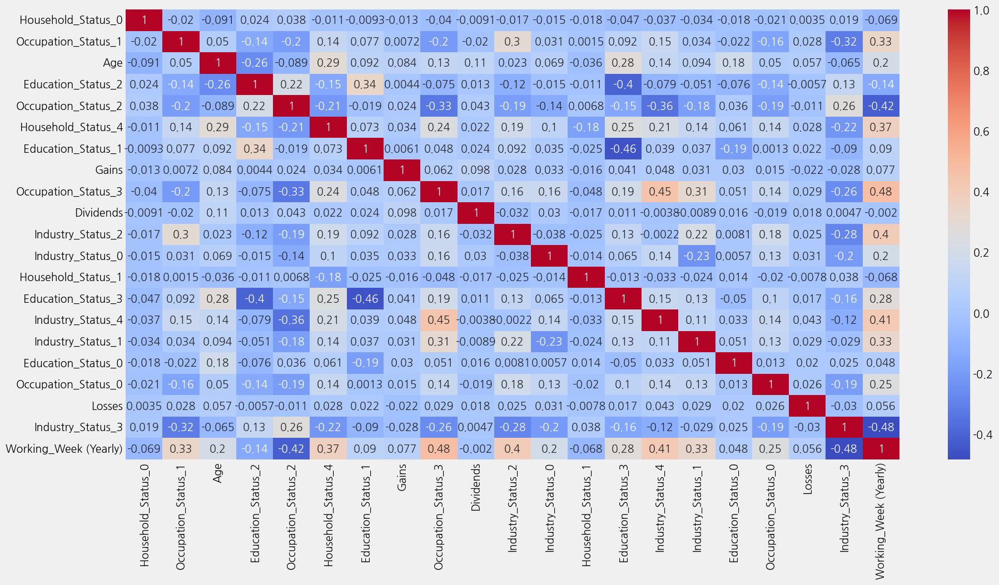

In [ ]:
# 상관 행렬 시각화
plt.figure(figsize=(20, 10))
sns.heatmap(enc_tr_s.corr(), annot=True, cmap='coolwarm')
plt.show()

In [ ]:
# 'Household_Status_4', 'Household_Status_2', 'Birth_Country (Mother)_0',
#        'Industry_Status_0', 'Occupation_Status_1', 'Education_Status_3',
#        'Race_1', 'Working_Week (Yearly)', 'Employment_Status_1',
#        'Birth_Country (Mother)_1', 'Martial_Status_1', 'Age',
#        'Household_Status_3', 'Employment_Status_2', 'Industry_Status_1',
#        'Industry_Status_2', 'Hispanic_Origin_0', 'Education_Status_0',
#        'Tax_Status_1', 'Birth_Country_0', 'Birth_Country_1',
#        'Industry_Status_3', 'Tax_Status_2', 'Citizenship_1',
#        'Occupation_Status_3', 'Income_Status_0', 'Employment_Status_0',
#        'Hispanic_Origin_1', 'Household_Summary_0', 'Household_Summary_1',
#        'Employment_Status_3', 'Tax_Status_0', 'Martial_Status_0',
#        'Education_Status_4', 'Household_Status_1', 'Occupation_Status_2',
#        'Birth_Country (Father)_1', 'Martial_Status_2', 'Race_0',
#        'Education_Status_1', 'Race_2', 'Education_Status_2',
#        'Household_Summary_3', 'Gender_1', 'Income_Status_1',
#        'Occupation_Status_0', 'Citizenship_2', 'Citizenship_0',
#        'Birth_Country (Father)_0', 'Industry_Status_4', 'Household_Summary_2',
#        'Gender_0', 'Household_Status_0', 'Gains', 'Dividends', 'Losses'

In [ ]:
enc_tr_s.columns

Index(['Age', 'Household_Status_4', 'Industry_Status_2', 'Occupation_Status_0',
       'Occupation_Status_2', 'Industry_Status_1', 'Education_Status_3',
       'Industry_Status_0', 'Education_Status_1', 'Household_Status_1',
       'Losses', 'Education_Status_2', 'Industry_Status_4',
       'Industry_Status_3', 'Household_Status_2', 'Household_Status_3',
       'Gains', 'Dividends', 'Household_Status_0', 'Education_Status_0',
       'Occupation_Status_3', 'Occupation_Status_1', 'Working_Week (Yearly)'],
      dtype='object')

In [ ]:
# 컬럼 선택
enc_tr = enc_tr[['Age', 'Household_Status_4', 'Industry_Status_2', 'Occupation_Status_0',
       'Occupation_Status_2', 'Industry_Status_1', 'Education_Status_3',
       'Industry_Status_0', 'Education_Status_1', 'Household_Status_1',
       'Losses', 'Education_Status_2', 'Industry_Status_4',
       'Industry_Status_3', 'Gains', 'Dividends', 'Household_Status_0', 'Education_Status_0',
       'Occupation_Status_3', 'Occupation_Status_1', 'Working_Week (Yearly)']]

enc_te = enc_te[['Age', 'Household_Status_4', 'Industry_Status_2', 'Occupation_Status_0',
       'Occupation_Status_2', 'Industry_Status_1', 'Education_Status_3',
       'Industry_Status_0', 'Education_Status_1', 'Household_Status_1',
       'Losses', 'Education_Status_2', 'Industry_Status_4',
       'Industry_Status_3', 'Gains', 'Dividends', 'Household_Status_0', 'Education_Status_0',
       'Occupation_Status_3', 'Occupation_Status_1', 'Working_Week (Yearly)']]

enc_ori_te = enc_ori_te[['Age', 'Household_Status_4', 'Industry_Status_2', 'Occupation_Status_0',
       'Occupation_Status_2', 'Industry_Status_1', 'Education_Status_3',
       'Industry_Status_0', 'Education_Status_1', 'Household_Status_1',
       'Losses', 'Education_Status_2', 'Industry_Status_4',
       'Industry_Status_3', 'Gains', 'Dividends', 'Household_Status_0', 'Education_Status_0',
       'Occupation_Status_3', 'Occupation_Status_1', 'Working_Week (Yearly)']]

## 3-9) Feature Engineering

In [ ]:
import statsmodels.api as sm

### 변수 선택 - 전진 선택

In [ ]:
## 전진 선택법
variables = enc_tr.columns.tolist() ## 설명 변수 리스트

y = y_tr.values.reshape(-1,1)
selected_variables = [] ## 선택된 변수들
sl_enter = 0.05

sv_per_step = [] ## 각 스텝별로 선택된 변수들
adjusted_r_squared = [] ## 각 스텝별 수정된 결정계수
steps = [] ## 스텝
step = 0
while len(variables) > 0:
    remainder = list(set(variables) - set(selected_variables))
    pval = pd.Series(index=remainder) ## 변수의 p-value
    ## 기존에 포함된 변수와 새로운 변수 하나씩 돌아가면서
    ## 선형 모형을 적합한다.
    for col in tqdm(remainder):
        X = enc_tr[selected_variables+[col]]
        model = sm.OLS(y,sm.add_constant(X)).fit()
        pval[col] = model.pvalues[col]

    min_pval = pval.min()
    if min_pval < sl_enter: ## 최소 p-value 값이 기준 값보다 작으면 포함
        selected_variables.append(pval.idxmin())

        step += 1
        steps.append(step)
        adj_r_squared = sm.OLS(y,sm.add_constant(enc_tr[selected_variables])).fit().rsquared_adj
        adjusted_r_squared.append(adj_r_squared)
        sv_per_step.append(selected_variables.copy())
    else:
        break

 33%|███▎      | 83/255 [00:01<00:02, 74.03it/s]


KeyboardInterrupt: 

In [ ]:
len(selected_variables)

In [ ]:
selected_variables

In [ ]:
# 결과 확인 시각화
fig = plt.figure(figsize=(10,10))
fig.set_facecolor('white')

font_size = 15
plt.xticks(steps,[f'step {s}\n'+'\n'.join(sv_per_step[i]) for i,s in enumerate(steps)], fontsize=12)
plt.plot(steps,adjusted_r_squared, marker='o')

plt.ylabel('Adjusted R Squared',fontsize=font_size)
plt.grid(True)
plt.show()

### 변수 선택 - 후진 선택법

In [ ]:
## 후진 소거법
variables = enc_tr.columns.tolist() ## 설명 변수 리스트

y = y_tr.values.reshape(-1,1)
selected_variables = variables ## 초기에는 모든 변수가 선택된 상태
sl_remove = 0.05

sv_per_step = [] ## 각 스텝별로 선택된 변수들
adjusted_r_squared = [] ## 각 스텝별 수정된 결정계수
steps = [] ## 스텝
step = 0
while len(selected_variables) > 0:
    X = sm.add_constant(enc_tr[selected_variables])
    p_vals = sm.OLS(y,X).fit().pvalues[1:] ## 절편항의 p-value는 뺀다
    max_pval = p_vals.max() ## 최대 p-value
    if max_pval >= sl_remove: ## 최대 p-value값이 기준값보다 크거나 같으면 제외
        remove_variable = p_vals.idxmax()
        selected_variables.remove(remove_variable)

        step += 1
        steps.append(step)
        adj_r_squared = sm.OLS(y,sm.add_constant(enc_tr[selected_variables])).fit().rsquared_adj
        adjusted_r_squared.append(adj_r_squared)
        sv_per_step.append(selected_variables.copy())
    else:
        break

In [ ]:
# 결과 시각화
fig = plt.figure(figsize=(10,10))
fig.set_facecolor('white')

font_size = 15
plt.xticks(steps,[f'step {s}\n'+'\n'.join(sv_per_step[i]) for i,s in enumerate(steps)], fontsize=12)
plt.plot(steps,adjusted_r_squared, marker='o')

plt.ylabel('Adjusted R Squared',fontsize=font_size)
plt.grid(True)
plt.show()

In [ ]:
len(selected_variables)

### 변수 선택 - Stepwise

In [ ]:
%%time
## 전진 단계별 선택법
variables = enc_tr.columns.tolist() ## 설명 변수 리스트

y = y_tr.values.reshape(-1,1) ## 반응 변수
selected_variables = [] ## 선택된 변수들
sl_enter = 0.05
sl_remove = 0.05

sv_per_step = [] ## 각 스텝별로 선택된 변수들
adjusted_r_squared = [] ## 각 스텝별 수정된 결정계수
steps = [] ## 스텝
step = 0
while len(variables) > 0:
    remainder = list(set(variables) - set(selected_variables))
    pval = pd.Series(index=remainder) ## 변수의 p-value
    ## 기존에 포함된 변수와 새로운 변수 하나씩 돌아가면서
    ## 선형 모형을 적합한다.
    for col in tqdm(remainder):
        X = enc_tr[selected_variables+[col]]
        X = sm.add_constant(X)
        model = sm.OLS(y,X).fit()
        pval[col] = model.pvalues[col]

    min_pval = pval.min()
    if min_pval < sl_enter: ## 최소 p-value 값이 기준 값보다 작으면 포함
        selected_variables.append(pval.idxmin())
        ## 선택된 변수들에대해서
        ## 어떤 변수를 제거할지 고른다.
        while len(selected_variables) > 0:
            selected_X = enc_tr[selected_variables]
            selected_X = sm.add_constant(selected_X)
            selected_pval = sm.OLS(y,selected_X).fit().pvalues[1:] ## 절편항의 p-value는 뺀다
            max_pval = selected_pval.max()
            if max_pval >= sl_remove: ## 최대 p-value값이 기준값보다 크거나 같으면 제외
                remove_variable = selected_pval.idxmax()
                selected_variables.remove(remove_variable)
            else:
                break

        step += 1
        steps.append(step)
        adj_r_squared = sm.OLS(y,sm.add_constant(enc_tr[selected_variables])).fit().rsquared_adj
        adjusted_r_squared.append(adj_r_squared)
        sv_per_step.append(selected_variables.copy())
    else:
        break

100%|██████████| 210/210 [00:24<00:00,  8.46it/s]

CPU times: user 11min 42s, sys: 5min 47s, total: 17min 29s
Wall time: 10min 46s


In [ ]:
selected_variables

['Occupation_Status_Unknown',
 'Occupation_Status_Craft & Repair',
 'Industry_Status_Hospitals',
 'Occupation_Status_Services',
 'Working_Week (Yearly)',
 'Industry_Status_Public Administration',
 'Occupation_Status_Sales',
 'Employment_Status_Seeking Full-Time',
 'Occupation_Status_Management',
 'Household_Summary_Householder',
 'Hispanic_Origin_ All other',
 'Tax_Status_Married Filling Jointly both under 65 (MFJ)',
 'Industry_Status_Agriculture',
 'Occupation_Status_Technicians & Support',
 'Industry_Status_Transportation',
 'Industry_Status_Manufacturing (Durable)',
 'Industry_Status_Utilities & Sanitary',
 'Income_Status_Over Median',
 'Industry_Status_Medical (except Hospitals)',
 'Citizenship_Foreign-born (Naturalized US Citizen)',
 'Industry_Status_Entertainment',
 'Education_Status_Elementary',
 'Education_Status_Professional degree',
 'Education_Status_Associates degree (Vocational)',
 'Industry_Status_Private Household Services',
 'Birth_Country_India',
 'Education_Status_Hig

In [ ]:
len(selected_variables)

50

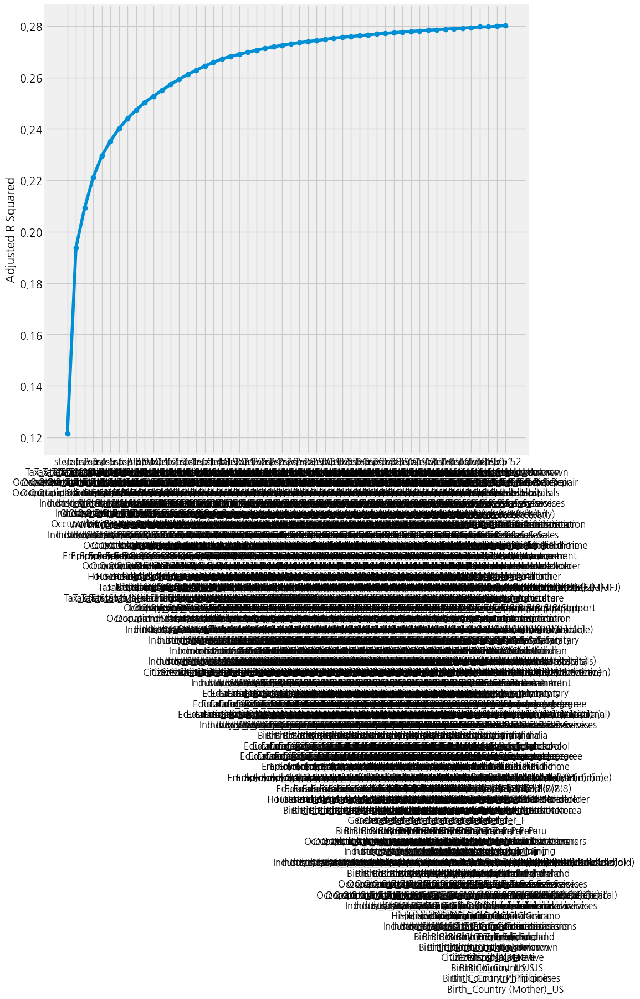

In [ ]:
# 결과 확인 시각화
fig = plt.figure(figsize=(10,10))
fig.set_facecolor('white')

font_size = 15
plt.xticks(steps,[f'step {s}\n'+'\n'.join(sv_per_step[i]) for i,s in enumerate(steps)], fontsize=12)
plt.plot(steps,adjusted_r_squared, marker='o')

plt.ylabel('Adjusted R Squared',fontsize=font_size)
plt.grid(True)
plt.show()

In [ ]:
selected_variables

['Occupation_Status_Unknown',
 'Occupation_Status_Craft & Repair',
 'Industry_Status_Hospitals',
 'Occupation_Status_Services',
 'Working_Week (Yearly)',
 'Industry_Status_Public Administration',
 'Occupation_Status_Sales',
 'Employment_Status_Seeking Full-Time',
 'Occupation_Status_Management',
 'Household_Summary_Householder',
 'Hispanic_Origin_ All other',
 'Tax_Status_Married Filling Jointly both under 65 (MFJ)',
 'Industry_Status_Agriculture',
 'Occupation_Status_Technicians & Support',
 'Industry_Status_Transportation',
 'Industry_Status_Manufacturing (Durable)',
 'Industry_Status_Utilities & Sanitary',
 'Income_Status_Over Median',
 'Industry_Status_Medical (except Hospitals)',
 'Citizenship_Foreign-born (Naturalized US Citizen)',
 'Industry_Status_Entertainment',
 'Education_Status_Elementary',
 'Education_Status_Professional degree',
 'Education_Status_Associates degree (Vocational)',
 'Industry_Status_Private Household Services',
 'Birth_Country_India',
 'Education_Status_Hig

In [ ]:
# 변수 최종 선택
enc_tr = enc_tr[['Occupation_Status_Unknown',
 'Occupation_Status_Craft & Repair',
 'Industry_Status_Hospitals',
 'Occupation_Status_Services',
 'Working_Week (Yearly)',
 'Industry_Status_Public Administration',
 'Occupation_Status_Sales',
 'Employment_Status_Seeking Full-Time',
 'Occupation_Status_Management',
 'Household_Summary_Householder',
 'Hispanic_Origin_ All other',
 'Tax_Status_Married Filling Jointly both under 65 (MFJ)',
 'Industry_Status_Agriculture',
 'Occupation_Status_Technicians & Support',
 'Industry_Status_Transportation',
 'Industry_Status_Manufacturing (Durable)',
 'Industry_Status_Utilities & Sanitary',
 'Income_Status_Over Median',
 'Industry_Status_Medical (except Hospitals)',
 'Citizenship_Foreign-born (Naturalized US Citizen)',
 'Industry_Status_Entertainment',
 'Education_Status_Elementary',
 'Education_Status_Professional degree',
 'Education_Status_Associates degree (Vocational)',
 'Industry_Status_Private Household Services',
 'Birth_Country_India',
 'Education_Status_High school',
 'Education_Status_Doctorate degree',
 'Employment_Status_Full-Time',
 'Employment_Status_Part-Time (Usually Part-Time)',
 'Education_Status_Middle (7-8)',
 'Household_Summary_Child 18 or older',
 'Birth_Country (Father)_South Korea',
 'Gender_F',
 'Birth_Country_Peru',
 'Occupation_Status_Handlers/Cleaners',
 'Industry_Status_Mining',
 'Industry_Status_Personal Services (except Private Household)',
 'Birth_Country (Father)_Ireland',
 'Occupation_Status_Protective Services',
 'Occupation_Status_Admin Support (include Clerical)',
 'Industry_Status_Other professional services',
 'Hispanic_Origin_ Chicano',
 'Industry_Status_Communications',
 'Birth_Country_England',
 'Birth_Country_Unknown',
 'Citizenship_Native',
 'Birth_Country_US',
 'Birth_Country_Philippines',
 'Birth_Country (Mother)_US']]

enc_te = enc_te[['Occupation_Status_Unknown',
 'Occupation_Status_Craft & Repair',
 'Industry_Status_Hospitals',
 'Occupation_Status_Services',
 'Working_Week (Yearly)',
 'Industry_Status_Public Administration',
 'Occupation_Status_Sales',
 'Employment_Status_Seeking Full-Time',
 'Occupation_Status_Management',
 'Household_Summary_Householder',
 'Hispanic_Origin_ All other',
 'Tax_Status_Married Filling Jointly both under 65 (MFJ)',
 'Industry_Status_Agriculture',
 'Occupation_Status_Technicians & Support',
 'Industry_Status_Transportation',
 'Industry_Status_Manufacturing (Durable)',
 'Industry_Status_Utilities & Sanitary',
 'Income_Status_Over Median',
 'Industry_Status_Medical (except Hospitals)',
 'Citizenship_Foreign-born (Naturalized US Citizen)',
 'Industry_Status_Entertainment',
 'Education_Status_Elementary',
 'Education_Status_Professional degree',
 'Education_Status_Associates degree (Vocational)',
 'Industry_Status_Private Household Services',
 'Birth_Country_India',
 'Education_Status_High school',
 'Education_Status_Doctorate degree',
 'Employment_Status_Full-Time',
 'Employment_Status_Part-Time (Usually Part-Time)',
 'Education_Status_Middle (7-8)',
 'Household_Summary_Child 18 or older',
 'Birth_Country (Father)_South Korea',
 'Gender_F',
 'Birth_Country_Peru',
 'Occupation_Status_Handlers/Cleaners',
 'Industry_Status_Mining',
 'Industry_Status_Personal Services (except Private Household)',
 'Birth_Country (Father)_Ireland',
 'Occupation_Status_Protective Services',
 'Occupation_Status_Admin Support (include Clerical)',
 'Industry_Status_Other professional services',
 'Hispanic_Origin_ Chicano',
 'Industry_Status_Communications',
 'Birth_Country_England',
 'Birth_Country_Unknown',
 'Citizenship_Native',
 'Birth_Country_US',
 'Birth_Country_Philippines',
 'Birth_Country (Mother)_US']]

enc_ori_te = enc_ori_te[['Occupation_Status_Unknown',
 'Occupation_Status_Craft & Repair',
 'Industry_Status_Hospitals',
 'Occupation_Status_Services',
 'Working_Week (Yearly)',
 'Industry_Status_Public Administration',
 'Occupation_Status_Sales',
 'Employment_Status_Seeking Full-Time',
 'Occupation_Status_Management',
 'Household_Summary_Householder',
 'Hispanic_Origin_ All other',
 'Tax_Status_Married Filling Jointly both under 65 (MFJ)',
 'Industry_Status_Agriculture',
 'Occupation_Status_Technicians & Support',
 'Industry_Status_Transportation',
 'Industry_Status_Manufacturing (Durable)',
 'Industry_Status_Utilities & Sanitary',
 'Income_Status_Over Median',
 'Industry_Status_Medical (except Hospitals)',
 'Citizenship_Foreign-born (Naturalized US Citizen)',
 'Industry_Status_Entertainment',
 'Education_Status_Elementary',
 'Education_Status_Professional degree',
 'Education_Status_Associates degree (Vocational)',
 'Industry_Status_Private Household Services',
 'Birth_Country_India',
 'Education_Status_High school',
 'Education_Status_Doctorate degree',
 'Employment_Status_Full-Time',
 'Employment_Status_Part-Time (Usually Part-Time)',
 'Education_Status_Middle (7-8)',
 'Household_Summary_Child 18 or older',
 'Birth_Country (Father)_South Korea',
 'Gender_F',
 'Birth_Country_Peru',
 'Occupation_Status_Handlers/Cleaners',
 'Industry_Status_Mining',
 'Industry_Status_Personal Services (except Private Household)',
 'Birth_Country (Father)_Ireland',
 'Occupation_Status_Protective Services',
 'Occupation_Status_Admin Support (include Clerical)',
 'Industry_Status_Other professional services',
 'Hispanic_Origin_ Chicano',
 'Industry_Status_Communications',
 'Birth_Country_England',
 'Birth_Country_Unknown',
 'Citizenship_Native',
 'Birth_Country_US',
 'Birth_Country_Philippines',
 'Birth_Country (Mother)_US']]

In [ ]:
# 변수 최종 선택
enc_tr = enc_tr[['Working_Week (Yearly)',
 'Occupation_Status_3',
 'Occupation_Status_0',
 'Industry_Status_1',
 'Industry_Status_0',
 'Industry_Status_4',
 'Industry_Status_3',
 'Age',
 'Occupation_Status_2']]

enc_te = enc_te[['Working_Week (Yearly)',
 'Occupation_Status_3',
 'Occupation_Status_0',
 'Industry_Status_1',
 'Industry_Status_0',
 'Industry_Status_4',
 'Industry_Status_3',
 'Age',
 'Occupation_Status_2']]

enc_ori_te = enc_ori_te[['Working_Week (Yearly)',
 'Occupation_Status_3',
 'Occupation_Status_0',
 'Industry_Status_1',
 'Industry_Status_0',
 'Industry_Status_4',
 'Industry_Status_3',
 'Age',
 'Occupation_Status_2']]

##### column 정리

In [ ]:
print(f'before: {X_tr.shape} / {X_te.shape} / {y_tr.shape} / {y_te.shape}')

print(f'after: {enc_tr.shape} / {enc_te.shape}')

before: (13976, 21) / (5991, 21) / (13976,) / (5991,)
after: (13976, 50) / (5991, 50)


### 4. 모델 학습 및 평가

In [ ]:
# 모델 평가
def eval_model(X_te,y_te, y_pred):
  from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

  # 데이터의 샘플 크기
  n = len(y_te)

  # 독립 변수의 수
  p = X_te.shape[1]

  rmse = mean_squared_error(y_te, y_pred, squared=False)
  mae = mean_absolute_error(y_te, y_pred)
  r2 = r2_score(y_te, y_pred)
  # 조정된 결정계수 계산
  adjusted_r_squared = 1 - (1 - r2) * (n - 1) / (n - p - 1)

  return rmse,mae,r2,adjusted_r_squared

In [ ]:
# 모델 학습과 평가
def train_model(model,enc_tr,enc_te,y_te):
    # 평가 지표 결과를 저장할 빈 리스트 생성
    results = []

    model.fit(enc_tr, y_tr)
    y_pred = model.predict(enc_te)

    # 평가지표
    rmse,mae,r2,adjusted_r_squared = eval_model(enc_tr,y_te,y_pred)

    # 결과를 딕셔너리로 저장 후 리스트에 추가
    result = {
          'MAE': mae,
          'RMSE': rmse,
          'R-squared': r2,
          'Adjusted-R-squared': adjusted_r_squared
      }

    results.append(result)

    # 결과를 데이터프레임으로 변환
    result_df = pd.DataFrame(results)
    return result_df

## Linear Regression

In [ ]:
%%time
from sklearn.linear_model import LinearRegression

modelV0 = LinearRegression()
print('\nLinearRegression')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV0,enc_tr,enc_te,y_te)


LinearRegression
(13976, 50) / (13976,)
CPU times: user 63.1 ms, sys: 19.4 ms, total: 82.5 ms
Wall time: 53.9 ms


,MAE,RMSE,R-squared,Adjusted-R-squared
0,345.292414,590.47045,0.279041,0.272973


In [ ]:
# 최적 파라미터 찾기
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import GridSearchCV

# # 데이터와 레이블 준비
# X = enc_tr # feature 데이터
# y = y_tr # target 데이터

# # 랜덤 포레스트 분류기 객체 생성
# rf_clf = RandomForestClassifier()

# # 탐색할 하이퍼파라미터 후보군 설정
# param_grid = {
#     'n_estimators': [50, 100, 200, 300]
# }

# # GridSearchCV 객체 생성
# grid_search = GridSearchCV(rf_clf, param_grid, cv=5, n_jobs=-1)

# # 그리드 서치 수행
# grid_search.fit(X, y)

# # 최적의 하이퍼파라미터와 최고 예측 정확도 출력
# print("Best parameter: ", grid_search.best_params_)
# print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

### - Feature Importance

In [ ]:
# 회귀 계수와 절편을 확인합니다.
print("회귀 계수:", modelV0.coef_)
print("절편:", modelV0.intercept_)

회귀 계수: [ 2.03202287e+02  3.17665345e+02 -1.34285339e+02  1.19930319e+02
  3.07943601e+02 -1.56576066e+02 -4.51648175e+02  1.67731905e+02
  2.59936237e+02  3.75703352e+02 -1.37024291e+02 -7.98783927e+01
  1.44305343e+02  1.67173371e+02 -1.80413787e+02 -3.02870095e+13
  3.95351944e+02  1.16225699e+02  1.36104700e+02 -3.31047323e+02
  1.69219265e+02  4.17183517e+01 -1.45218220e+02 -5.76307124e+01
  8.38514425e+01 -4.48634965e+01  7.67928854e+01  1.73760942e+02
  9.38021490e+01  1.80668841e+02  7.71698542e+01 -2.18772633e+02
 -7.47312887e+01 -9.28019173e+01  3.02870095e+13  4.43071016e+01
  4.94712932e+01  1.85746011e+02 -8.20035727e+01 -1.54861635e+02
  6.68521758e+01 -1.57094002e+02]
절편: 494.1197844755801


In [ ]:
df_feature_importances = pd.DataFrame(modelV0.coef_, enc_tr.columns).sort_values(by=[0], ascending=False).reset_index()

print(f'{df_feature_importances.shape}')
df_feature_importances

(42, 2)


,index,0
0,Industry_Status_Not in universe or children,3.028701e+13
1,Martial_Status_Married (Armed Force Spouse),3.953519e+02
2,Industry_Status_Utilities & Sanitary,3.757034e+02
3,Industry_Status_Hospitals,3.176653e+02
4,Industry_Status_Transportation,3.079436e+02
5,Industry_Status_Public Administration,2.599362e+02
6,Occupation_Status_Craft & Repair,2.032023e+02
7,Household_Status_Other Relative 18+ never marr...,1.857460e+02
8,Industry_Status_Mining,1.806688e+02
9,Industry_Status_Communications,1.737609e+02


## Ridge Regression

In [ ]:
# %%time
# # 최적의 파라미터 찾기
# from sklearn.linear_model import RidgeCV

# # Ridge 모델 생성 및 alpha 값 범위 설정
# alphas = [0.1, 1.0, 10.0]  # 적절한 alpha 값들을 리스트로 지정합니다.
# ridge_model = RidgeCV(alphas=alphas, cv=5)  # 교차 검증을 사용하여 최적의 alpha 값을 찾습니다.

# # 모델 학습
# ridge_model.fit(X_tr, y_tr)

# # 최적의 alpha 값 출력
# print("Optimal alpha:", ridge_model.alpha_)

In [ ]:
%%time
from sklearn.linear_model import Ridge

modelV1 = Ridge()
print('\nnRidge Regression')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV1,enc_tr,enc_te,y_te)


nRidge Regression
(15973, 42) / (15973,)
CPU times: user 25 ms, sys: 9.02 ms, total: 34.1 ms
Wall time: 23.5 ms


,MAE,RMSE,R-squared,Adjusted-R-squared
0,344.277806,586.787333,0.270097,0.262338


### - Feature Importance

In [ ]:
# 회귀 계수와 절편을 확인합니다.
print("회귀 계수:", modelV1.coef_)
print("절편:", modelV1.intercept_)

회귀 계수: [ 203.2212704   316.97331492 -134.2557628   120.18437074  307.12950371
 -156.67778387 -447.10905467  167.32252344  259.13040057  372.9507271
 -136.86750206  -80.06612498  143.82578106  167.07956192 -179.90377439
 -248.30058692  388.07704601  115.92526936  135.5941751  -325.90686606
  168.3356762    41.82261728 -144.81595322  -57.61634358   83.76147585
  -44.83624927   76.88086461  172.39596867   93.5366185   178.42923336
   76.6964251  -215.53370323  -74.54000221  -92.37176868 -248.30058692
   44.30367948   49.62062581  183.20222107  -81.99491421 -152.9649214
   66.28158276 -154.42164899]
절편: 494.0407353896034


In [ ]:
df_feature_importances = pd.DataFrame(modelV1.coef_, enc_tr.columns).sort_values(by=[0], ascending=False).reset_index()

print(f'{df_feature_importances.shape}')
df_feature_importances

(42, 2)


,index,0
0,Martial_Status_Married (Armed Force Spouse),388.077046
1,Industry_Status_Utilities & Sanitary,372.950727
2,Industry_Status_Hospitals,316.973315
3,Industry_Status_Transportation,307.129504
4,Industry_Status_Public Administration,259.130401
5,Occupation_Status_Craft & Repair,203.221270
6,Household_Status_Other Relative 18+ never marr...,183.202221
7,Industry_Status_Mining,178.429233
8,Industry_Status_Communications,172.395969
9,Industry_Status_Entertainment,168.335676


## Lasso Regression

In [ ]:
%%time
from sklearn.linear_model import Lasso

modelV2 = Ridge()

print('\nnLasso Regression')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV2,enc_tr,enc_te,y_te)


nLasso Regression
(15973, 42) / (15973,)
CPU times: user 24.2 ms, sys: 5.06 ms, total: 29.2 ms
Wall time: 27.2 ms


,MAE,RMSE,R-squared,Adjusted-R-squared
0,344.277806,586.787333,0.270097,0.262338


### - Feature Importance

In [ ]:
# 회귀 계수와 절편을 확인합니다.
print("회귀 계수:", modelV2.coef_)
print("절편:", modelV2.intercept_)

회귀 계수: [ 203.2212704   316.97331492 -134.2557628   120.18437074  307.12950371
 -156.67778387 -447.10905467  167.32252344  259.13040057  372.9507271
 -136.86750206  -80.06612498  143.82578106  167.07956192 -179.90377439
 -248.30058692  388.07704601  115.92526936  135.5941751  -325.90686606
  168.3356762    41.82261728 -144.81595322  -57.61634358   83.76147585
  -44.83624927   76.88086461  172.39596867   93.5366185   178.42923336
   76.6964251  -215.53370323  -74.54000221  -92.37176868 -248.30058692
   44.30367948   49.62062581  183.20222107  -81.99491421 -152.9649214
   66.28158276 -154.42164899]
절편: 494.0407353896034


In [ ]:
df_feature_importances = pd.DataFrame(modelV2.coef_, enc_tr.columns).sort_values(by=[0], ascending=False).reset_index()

print(f'{df_feature_importances.shape}')
df_feature_importances

(42, 2)


,index,0
0,Martial_Status_Married (Armed Force Spouse),388.077046
1,Industry_Status_Utilities & Sanitary,372.950727
2,Industry_Status_Hospitals,316.973315
3,Industry_Status_Transportation,307.129504
4,Industry_Status_Public Administration,259.130401
5,Occupation_Status_Craft & Repair,203.221270
6,Household_Status_Other Relative 18+ never marr...,183.202221
7,Industry_Status_Mining,178.429233
8,Industry_Status_Communications,172.395969
9,Industry_Status_Entertainment,168.335676


## ElasticNet

In [ ]:
%%time
from sklearn.linear_model import ElasticNet

modelV3 = ElasticNet()

print('\nElasticNet Regression')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV3,enc_tr,enc_te,y_te)


ElasticNet Regression
(15973, 48) / (15973,)
CPU times: user 40.6 ms, sys: 13.9 ms, total: 54.5 ms
Wall time: 37.5 ms


,MAE,RMSE,R-squared,Adjusted-R-squared
0,403.984644,618.919135,0.187971,0.178091


### - Feature Importance

In [ ]:
# 회귀 계수와 절편을 확인합니다.
print("회귀 계수:", modelV3.coef_)
print("절편:", modelV3.intercept_)

회귀 계수: [  48.885759     27.54941014  -16.97778484  111.20429155   21.53011158
  -18.45012431   -4.12863273   32.07599431   15.69687507    7.71405273
   -2.05261612  -13.43605286   15.7352351    17.22283434   -3.83359189
 -116.70261244    1.87665965   28.21614354   16.36140758   -0.53427519
    2.5861602    48.45752172   -8.44815728  -17.23752827   17.79832867
   -3.33309072   13.87490632    3.52724526    4.80044294    2.04423731
    4.95782576   -0.           -6.1564899    -0.         -116.70216241
   51.32712971   67.41492611    0.37789549   -4.78200983   -0.49084216
    2.82257047   -0.32578574]
절편: 459.41811831647055


In [ ]:
df_feature_importances = pd.DataFrame(modelV3.coef_, enc_tr.columns).sort_values(by=[0], ascending=False).reset_index()

print(f'{df_feature_importances.shape}')
df_feature_importances

(42, 2)


,index,0
0,Working_Week (Yearly),111.204292
1,Tax_Status_Married Filling Jointly both under ...,67.414926
2,Household_Summary_Householder,51.327130
3,Occupation_Status_Craft & Repair,48.885759
4,Employment_Status_Full-Time,48.457522
5,Industry_Status_Manufacturing (Durable),32.075994
6,Occupation_Status_Professional,28.216144
7,Industry_Status_Hospitals,27.549410
8,Industry_Status_Transportation,21.530112
9,Occupation_Status_Machine Operators & Inspectors,17.798329


## SGDRegressor


In [ ]:
%%time
from sklearn.linear_model import SGDRegressor

modelV4 = SGDRegressor()

print('\nSGD Regression')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV4,enc_tr,enc_te,y_te)


SGD Regression
(15973, 54) / (15973,)
CPU times: user 342 ms, sys: 6.78 ms, total: 349 ms
Wall time: 346 ms


,MAE,RMSE,R-squared,Adjusted-R-squared
0,345.775182,585.992139,0.272074,0.262095


### Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV4, enc_tr)
shap_values = explainer(enc_te)

CPU times: user 141 ms, sys: 2.29 ms, total: 143 ms
Wall time: 158 ms


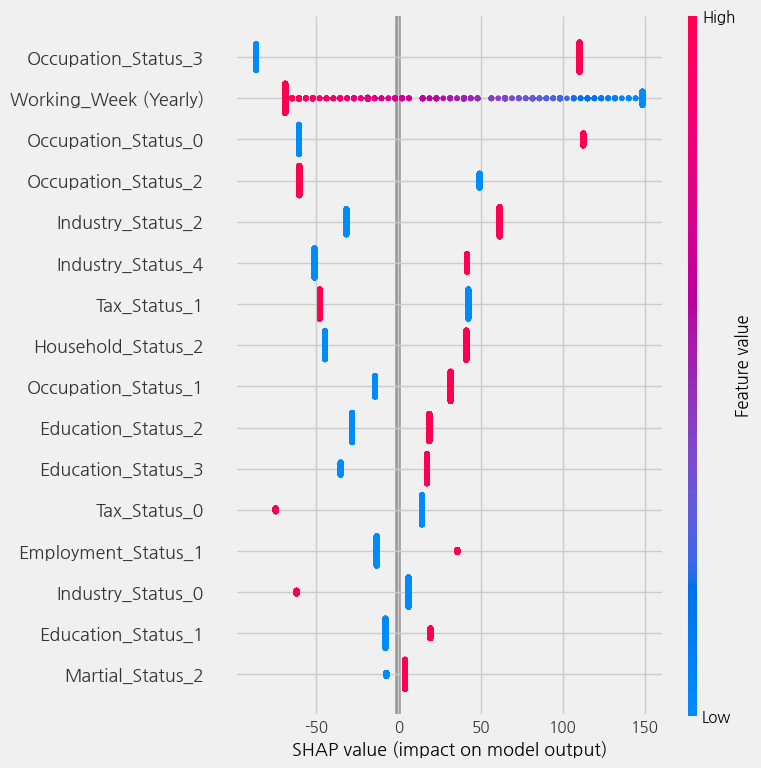

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

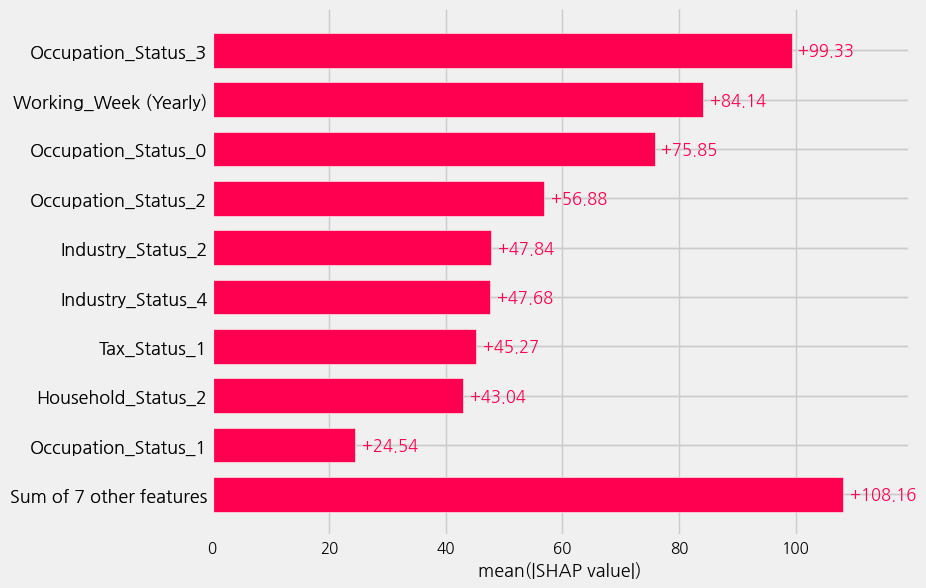

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable     Weight
2     Occupation_Status_3  99.329597
0   Working_Week (Yearly)  84.141171
3     Occupation_Status_0  75.847389
1     Occupation_Status_2  56.881994
4       Industry_Status_2  47.844989
5       Industry_Status_4  47.683045
9            Tax_Status_1  45.266325
6      Household_Status_2  43.035254
12    Occupation_Status_1  24.543630
11     Education_Status_2  23.700004
10     Education_Status_3  22.658590
8            Tax_Status_0  20.216349
7     Employment_Status_1  14.994339
13      Industry_Status_0  11.449901
14     Education_Status_1  10.828599
15       Martial_Status_2   4.312028


## DecisionTree

In [ ]:
%%time
from sklearn.tree import DecisionTreeRegressor

modelV5 = DecisionTreeRegressor(random_state=args.random_state)

print('\nDecisionTree Regression')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV5,enc_tr,enc_te,y_te)


DecisionTree Regression
(15973, 54) / (15973,)
CPU times: user 106 ms, sys: 774 µs, total: 106 ms
Wall time: 110 ms


,MAE,RMSE,R-squared,Adjusted-R-squared
0,406.962364,764.82499,-0.240018,-0.257017


### Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV5, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

CPU times: user 2.54 s, sys: 12 ms, total: 2.55 s
Wall time: 2.92 s


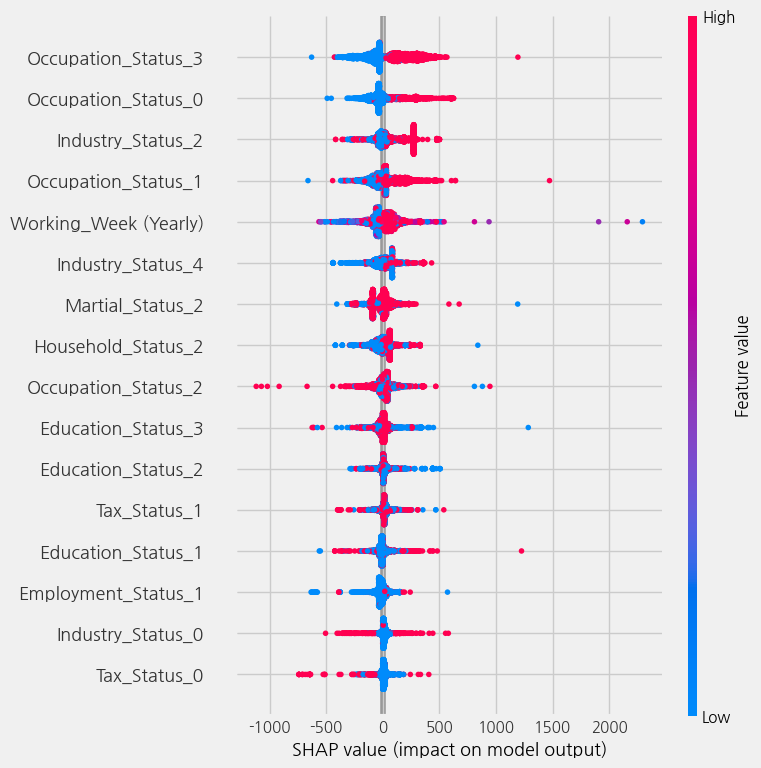

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

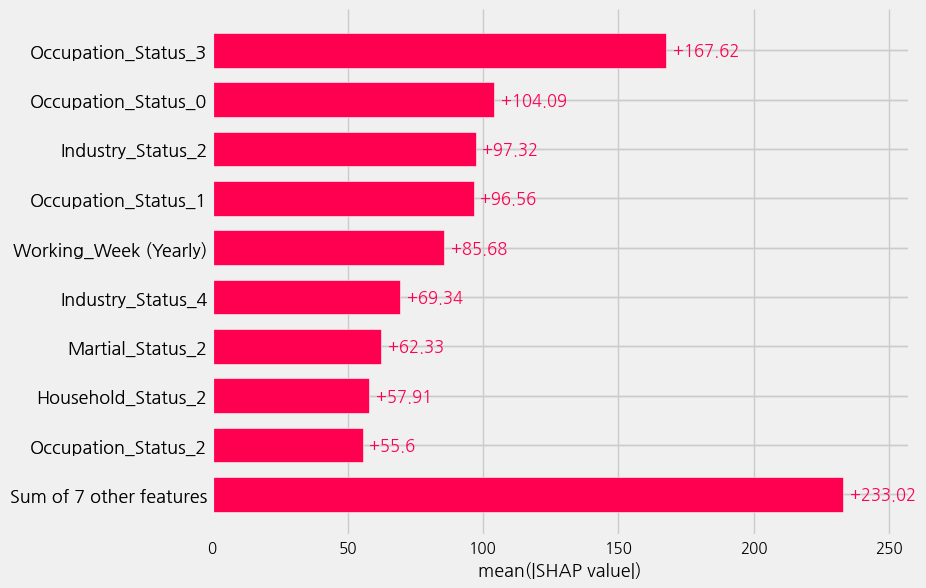

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable      Weight
2     Occupation_Status_3  167.615311
3     Occupation_Status_0  104.088386
4       Industry_Status_2   97.322243
12    Occupation_Status_1   96.561848
0   Working_Week (Yearly)   85.682111
5       Industry_Status_4   69.335074
15       Martial_Status_2   62.327282
6      Household_Status_2   57.906110
1     Occupation_Status_2   55.596966
10     Education_Status_3   44.952976
11     Education_Status_2   36.097326
9            Tax_Status_1   34.617939
14     Education_Status_1   34.216417
7     Employment_Status_1   31.759945
13      Industry_Status_0   25.869853
8            Tax_Status_0   25.503294


## Random Forest

In [ ]:
%%time
from sklearn.ensemble import RandomForestRegressor

modelV6 = RandomForestRegressor(random_state=args.random_state)

print('\nRandomForest Regression')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV6,enc_tr,enc_te,y_te)


RandomForest Regression
(15973, 54) / (15973,)
CPU times: user 8.26 s, sys: 2.51 ms, total: 8.26 s
Wall time: 10.7 s


,MAE,RMSE,R-squared,Adjusted-R-squared
0,359.035277,638.077537,0.136921,0.125089


### - Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV6, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

100%|===================| 3988/3994 [08:07<00:00]       

CPU times: user 8min 1s, sys: 3.36 s, total: 8min 5s
Wall time: 8min 7s


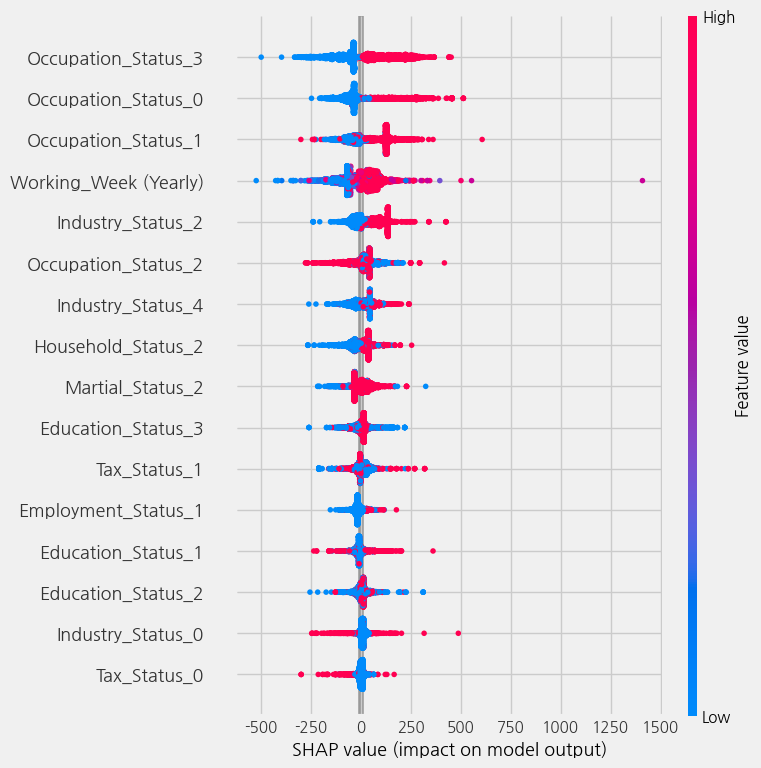

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

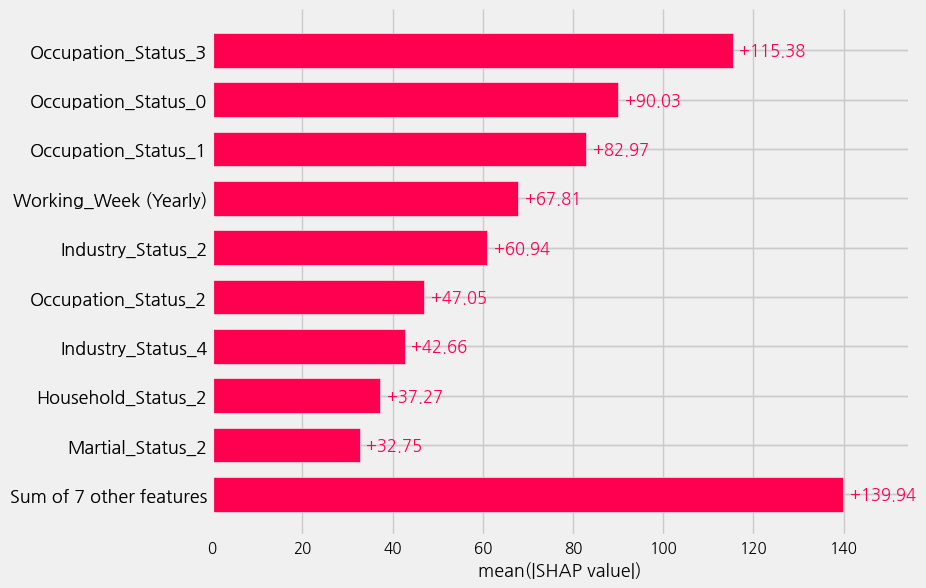

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable      Weight
2     Occupation_Status_3  115.375279
3     Occupation_Status_0   90.030522
12    Occupation_Status_1   82.967215
0   Working_Week (Yearly)   67.813342
4       Industry_Status_2   60.942951
1     Occupation_Status_2   47.045110
5       Industry_Status_4   42.658490
6      Household_Status_2   37.266722
15       Martial_Status_2   32.746816
10     Education_Status_3   26.591891
9            Tax_Status_1   25.823545
7     Employment_Status_1   20.361434
14     Education_Status_1   20.259479
11     Education_Status_2   20.213511
13      Industry_Status_0   14.956149
8            Tax_Status_0   11.736078


## Gradient Boosting

In [ ]:
%%time
from sklearn.ensemble import GradientBoostingRegressor

modelV7 = GradientBoostingRegressor(random_state=args.random_state)

print('\nGradient Boosting')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV7,enc_tr,enc_te,y_te)


Gradient Boosting
(15973, 54) / (15973,)
CPU times: user 1.72 s, sys: 1.36 ms, total: 1.72 s
Wall time: 1.74 s


,MAE,RMSE,R-squared,Adjusted-R-squared
0,346.330915,643.161162,0.251441,0.241179


### - Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV7, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

CPU times: user 3.36 s, sys: 10.1 ms, total: 3.37 s
Wall time: 3.36 s


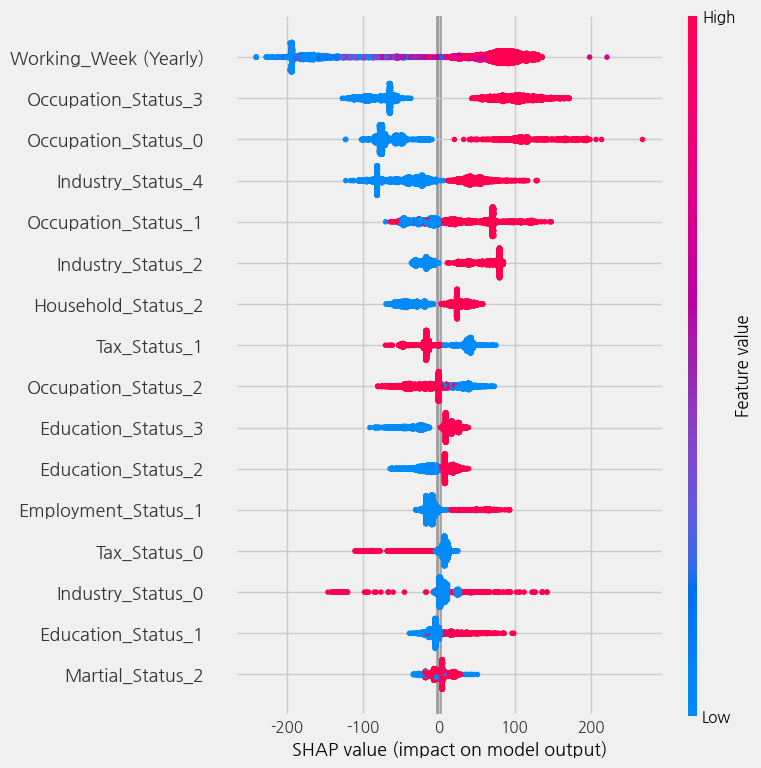

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

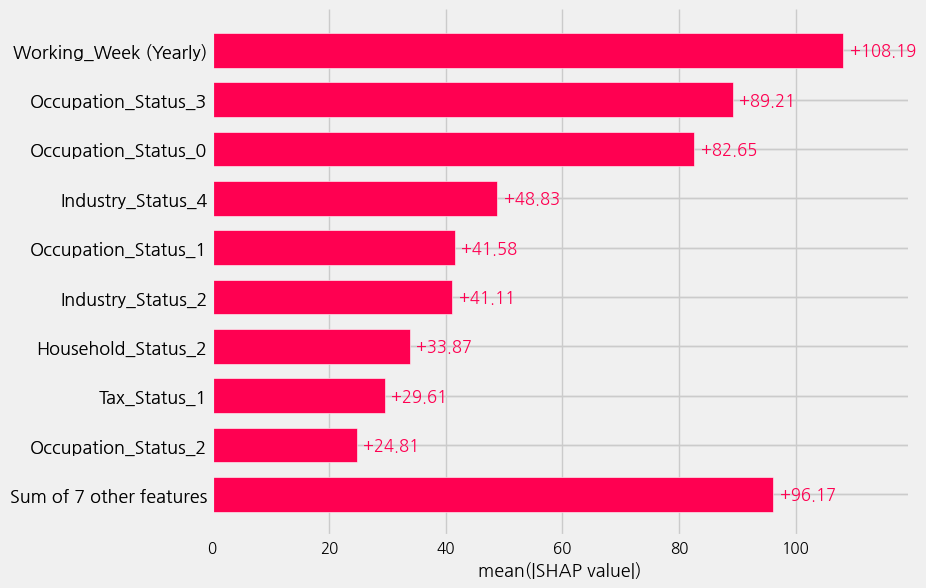

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable      Weight
0   Working_Week (Yearly)  108.194915
2     Occupation_Status_3   89.212545
3     Occupation_Status_0   82.652502
5       Industry_Status_4   48.827544
12    Occupation_Status_1   41.584338
4       Industry_Status_2   41.105704
6      Household_Status_2   33.865940
9            Tax_Status_1   29.608436
1     Occupation_Status_2   24.806835
10     Education_Status_3   21.366669
11     Education_Status_2   16.153825
7     Employment_Status_1   13.870611
8            Tax_Status_0   12.089817
13      Industry_Status_0   11.663605
14     Education_Status_1   11.621488
15       Martial_Status_2    9.402018


### - 최적 파라미터 찾기 - GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
# 모델 설정
gbr = GradientBoostingRegressor()

# 파라미터 그리드 설정
param_grid = {
    'n_estimators': [100, 300, 500, 1000],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 5],
    'max_features': ['sqrt', 'log2', None],
    'subsample': [0.5, 0.7, 0.9, 1.0]
}

In [ ]:
# Grid Search 실행
grid_search = GridSearchCV(gbr, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(enc_tr, y_tr)

print("Best parameters:", grid_search.best_params_)
print("Best score:", -grid_search.best_score_)

Fitting 5 folds for each of 3888 candidates, totalling 19440 fits
[CV] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.5; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.5; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END l

KeyboardInterrupt: 

### - 최적 파라미터 찾기 - Random Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from scipy.stats import randint as sp_randint
from scipy.stats import uniform

In [ ]:
# 모델 설정
gbr = GradientBoostingRegressor()

# 파라미터 분포 설정
param_dist = {
    'n_estimators': sp_randint(100, 1000),
    'learning_rate': uniform(0.01, 0.2),
    'max_depth': sp_randint(3, 10),
    'min_samples_split': sp_randint(2, 10),
    'min_samples_leaf': sp_randint(1, 10),
    'max_features': ['sqrt', 'log2', None],
    'subsample': uniform(0.5, 1.0) # 0.5 ~ 1.0 범위
}


In [ ]:
# Random Search 실행
random_search = RandomizedSearchCV(gbr, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', verbose=2, random_state=2024)
random_search.fit(enc_tr, y_tr)

print("Best parameters:", random_search.best_params_)
print("Best score:", -random_search.best_score_)

### Bayesian Optimization

In [ ]:
!pip install scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 1.2 MB/s eta 0:00:00


In [ ]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
# 모델 설정
gbr = GradientBoostingRegressor()

# 파라미터 공간 설정
param_space = {
    'n_estimators': Integer(100, 1000),
    'learning_rate': Real(0.01, 0.2, 'uniform'),
    'max_depth': Integer(3, 10),
    'min_samples_split': Integer(2, 10),
    'min_samples_leaf': Integer(1, 10),
    'max_features': Categorical(['sqrt', 'log2', None]),
    'subsample': Real(0.5, 1.0, 'uniform')
}

In [ ]:
# Bayesian Optimization 실행
bayes_search = BayesSearchCV(gbr, param_space, n_iter=32, cv=2, scoring='neg_mean_squared_error', verbose=2, random_state=2024)
bayes_search.fit(enc_tr, y_tr)

print("Best parameters:", bayes_search.best_params_)
print("Best score:", -bayes_search.best_score_)

Fitting 2 folds for each of 1 candidates, totalling 2 fits
[CV] END learning_rate=0.11920716623840741, max_depth=4, max_features=log2, min_samples_leaf=10, min_samples_split=6, n_estimators=845, subsample=0.9627516212165297; total time=   3.2s
[CV] END learning_rate=0.11920716623840741, max_depth=4, max_features=log2, min_samples_leaf=10, min_samples_split=6, n_estimators=845, subsample=0.9627516212165297; total time=   5.0s
Fitting 2 folds for each of 1 candidates, totalling 2 fits
[CV] END learning_rate=0.04616551908998558, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=7, n_estimators=632, subsample=0.5968383201547538; total time=  22.6s
[CV] END learning_rate=0.04616551908998558, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=7, n_estimators=632, subsample=0.5968383201547538; total time=  24.9s
Fitting 2 folds for each of 1 candidates, totalling 2 fits
[CV] END learning_rate=0.10096786576655069, max_depth=9, max_features=None, min_sampl

In [ ]:
modelV7_s = GradientBoostingRegressor(random_state=args.random_state,**bayes_search.best_params_)

print(f'{enc_tr.shape} / {y_tr.shape}')
modelV7_s.fit(enc_tr, y_tr)

(15973, 23) / (15973,)


GradientBoostingRegressor(learning_rate=0.04351408635305234, max_depth=5,
                          max_features='log2', min_samples_leaf=10,
                          min_samples_split=8, n_estimators=196,
                          random_state=2024, subsample=0.5274675922768043)

In [ ]:
train_model(modelV7_s,enc_tr,enc_te,y_te)

,MAE,RMSE,R-squared,Adjusted-R-squared
0,454.384275,657.058945,0.154649,0.149751


### - Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV11_s, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

 99%|===================| 3970/3994 [02:30<00:00]       

CPU times: user 2min 19s, sys: 1.07 s, total: 2min 20s
Wall time: 2min 30s


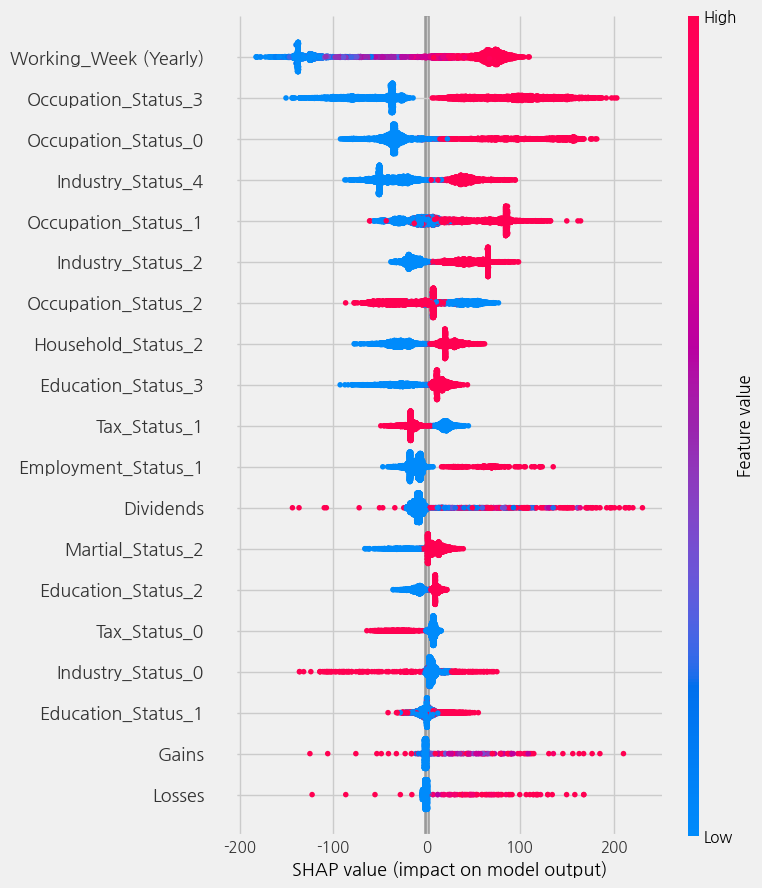

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

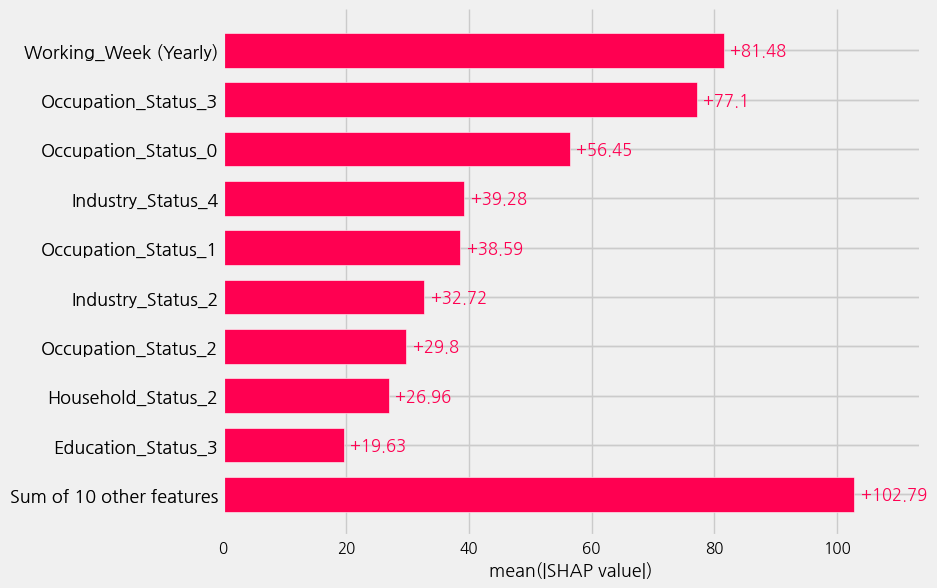

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable     Weight
0   Working_Week (Yearly)  81.480906
2     Occupation_Status_3  77.099538
3     Occupation_Status_0  56.447610
5       Industry_Status_4  39.275167
12    Occupation_Status_1  38.590984
4       Industry_Status_2  32.718594
1     Occupation_Status_2  29.795635
6      Household_Status_2  26.955505
10     Education_Status_3  19.631989
9            Tax_Status_1  18.608453
7     Employment_Status_1  16.505713
17              Dividends  15.682885
15       Martial_Status_2  11.267553
11     Education_Status_2  10.173202
8            Tax_Status_0   9.422310
13      Industry_Status_0   9.036406
14     Education_Status_1   6.455088
16                  Gains   3.034414
18                 Losses   2.604382


## CatBoost

#### - Feature Importance

In [ ]:
!pip install catboost

In [ ]:
%%time
from catboost import CatBoostRegressor

modelV8 = CatBoostRegressor(random_state=args.random_state)

print('\nCatBoost')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV8,enc_tr,enc_te,y_te)


CatBoost
(15973, 54) / (15973,)
Learning rate set to 0.063433
0:	learn: 691.3463706	total: 51.3ms	remaining: 51.3s
1:	learn: 682.3343194	total: 55.7ms	remaining: 27.8s
2:	learn: 674.0796941	total: 59.3ms	remaining: 19.7s
3:	learn: 666.6862455	total: 63ms	remaining: 15.7s
4:	learn: 660.0136652	total: 66.7ms	remaining: 13.3s
5:	learn: 654.3996073	total: 70.6ms	remaining: 11.7s
6:	learn: 648.9396048	total: 74.2ms	remaining: 10.5s
7:	learn: 644.0845394	total: 77.8ms	remaining: 9.65s
8:	learn: 640.1261124	total: 81.5ms	remaining: 8.98s
9:	learn: 636.3581681	total: 85.4ms	remaining: 8.45s
10:	learn: 632.8395621	total: 88.9ms	remaining: 8s
11:	learn: 629.7610935	total: 92.5ms	remaining: 7.62s
12:	learn: 626.9885636	total: 96ms	remaining: 7.29s
13:	learn: 624.4430864	total: 99.5ms	remaining: 7.01s
14:	learn: 622.1189107	total: 103ms	remaining: 6.79s
15:	learn: 620.1910688	total: 107ms	remaining: 6.58s
16:	learn: 618.4372990	total: 110ms	remaining: 6.39s
17:	learn: 616.7728166	total: 115ms	rem

,MAE,RMSE,R-squared,Adjusted-R-squared
0,333.776895,596.991778,0.24449,0.234132


### - Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV8, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

100%|===================| 3980/3994 [04:56<00:01]       

CPU times: user 4min 27s, sys: 2.21 s, total: 4min 30s
Wall time: 4min 58s


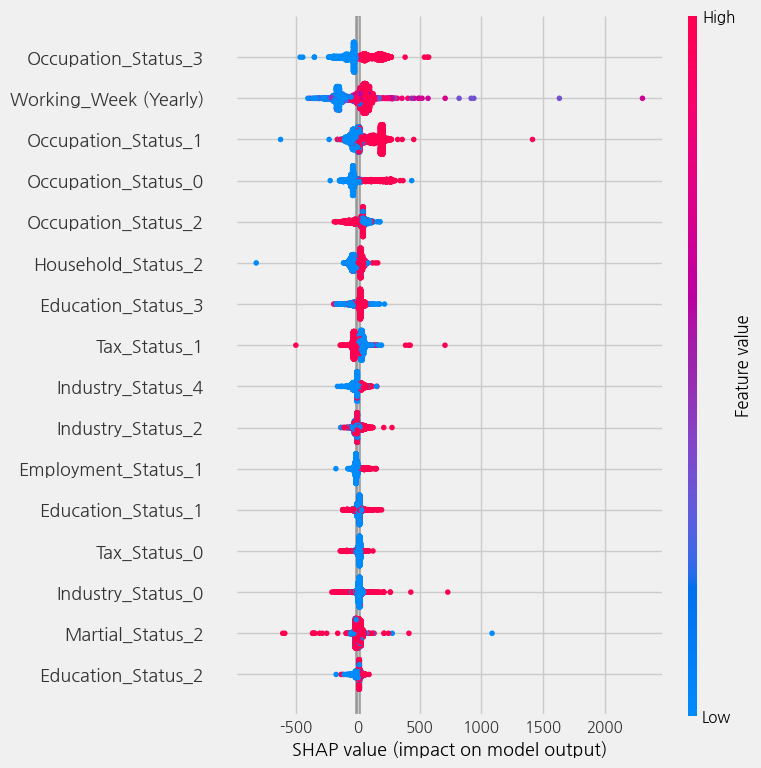

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

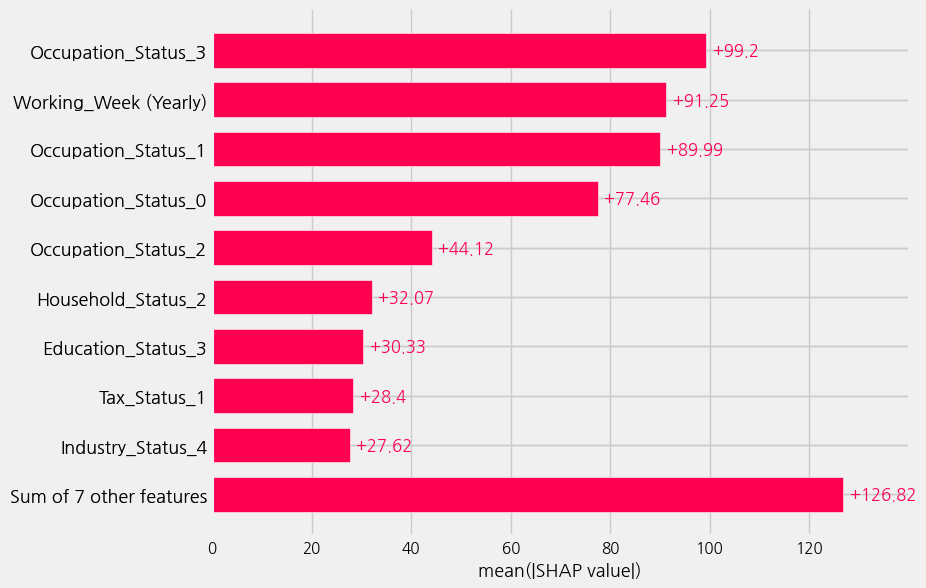

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable     Weight
2     Occupation_Status_3  99.198624
0   Working_Week (Yearly)  91.249528
12    Occupation_Status_1  89.986312
3     Occupation_Status_0  77.456964
1     Occupation_Status_2  44.123521
6      Household_Status_2  32.069837
10     Education_Status_3  30.325183
9            Tax_Status_1  28.399752
5       Industry_Status_4  27.616703
4       Industry_Status_2  22.957658
7     Employment_Status_1  18.607719
14     Education_Status_1  18.235635
8            Tax_Status_0  17.843731
13      Industry_Status_0  17.236808
15       Martial_Status_2  17.079788
11     Education_Status_2  14.859333


## XGBoost

In [ ]:
%%time
from xgboost import XGBRegressor

modelV9 = XGBRegressor(random_state=args.random_state)

print('\nXGboost')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV9,enc_tr,enc_te,y_te)


XGboost
(15973, 54) / (15973,)
CPU times: user 1.49 s, sys: 12.2 ms, total: 1.5 s
Wall time: 1.67 s


,MAE,RMSE,R-squared,Adjusted-R-squared
0,344.092043,624.059022,0.174428,0.16311


### - Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV9, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

 98%|===================| 3913/3994 [00:33<00:00]       

CPU times: user 33.3 s, sys: 186 ms, total: 33.4 s
Wall time: 33.7 s


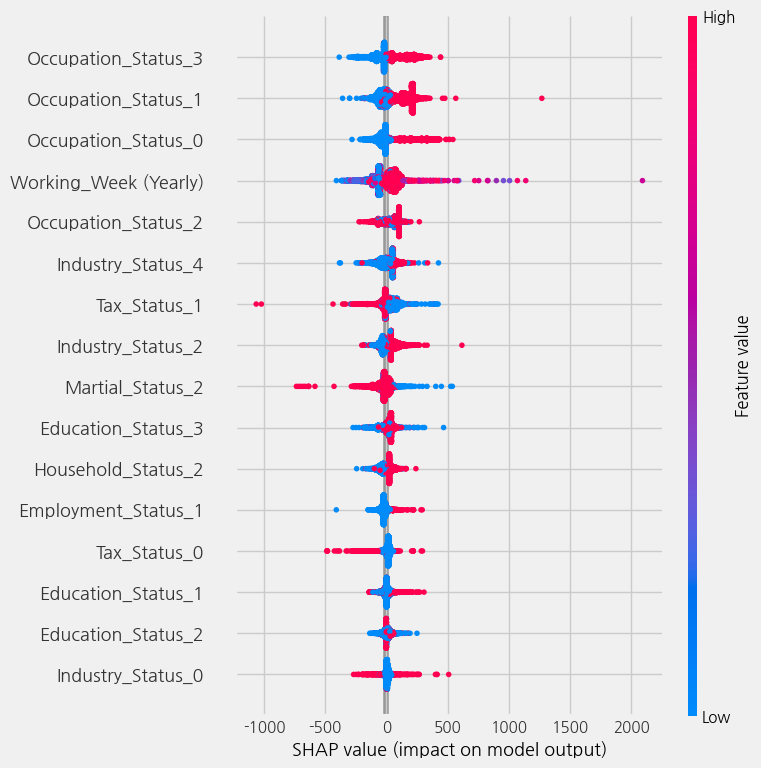

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

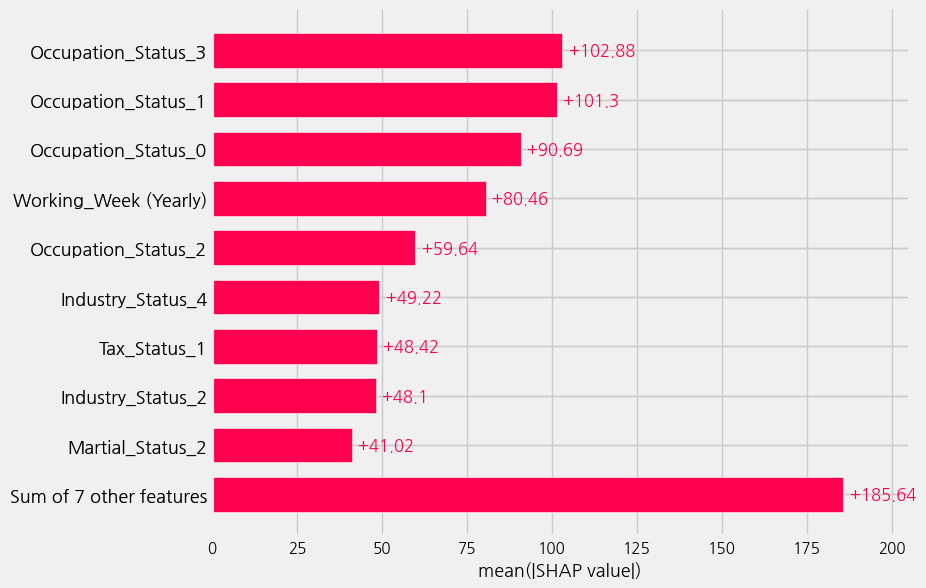

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable      Weight
2     Occupation_Status_3  102.877665
12    Occupation_Status_1  101.304950
3     Occupation_Status_0   90.692851
0   Working_Week (Yearly)   80.459437
1     Occupation_Status_2   59.635248
5       Industry_Status_4   49.221243
9            Tax_Status_1   48.415101
4       Industry_Status_2   48.097115
15       Martial_Status_2   41.021322
10     Education_Status_3   36.586030
6      Household_Status_2   35.442887
7     Employment_Status_1   26.502428
8            Tax_Status_0   24.327715
14     Education_Status_1   23.610389
11     Education_Status_2   21.964291
13      Industry_Status_0   17.201407


## LightGBM

In [ ]:
%%time
from lightgbm import LGBMRegressor

modelV10 = LGBMRegressor(random_state=args.random_state)

print('\nLightGBM')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV10,enc_tr,enc_te,y_te)


LightGBM
(13976, 50) / (13976,)
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 13976, number of used features: 48
[LightGBM] [Info] Start training from score 553.511305
CPU times: user 778 ms, sys: 44.6 ms, total: 823 ms
Wall time: 819 ms


,MAE,RMSE,R-squared,Adjusted-R-squared
0,328.410004,589.05186,0.282501,0.276462


최적 파라미터 찾기

In [ ]:
!pip install scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 1.2 MB/s eta 0:00:00


In [ ]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from lightgbm import LGBMRegressor

In [ ]:
# 모델 설정
lgbm = LGBMRegressor()

# 파라미터 공간 설정
param_space = {
    'num_leaves': Integer(20, 80),
    'learning_rate': Real(0.01, 0.3, 'uniform'),
    'n_estimators': Integer(100, 1000),
    'max_depth': Integer(5, 20),
    'min_child_weight': Real(0.001, 0.1, 'uniform'),
    'subsample': Real(0.5, 1.0, 'uniform'),
    'colsample_bytree': Real(0.5, 1.0, 'uniform')
}

In [ ]:
# Bayesian Optimization 실행
bayes_search = BayesSearchCV(lgbm, param_space, n_iter=32, cv=2, scoring='neg_mean_squared_error', verbose=2, random_state=2024)
bayes_search.fit(enc_tr, y_tr)

print("Best parameters:", bayes_search.best_params_)
print("Best score:", -bayes_search.best_score_)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [ ]:
modelV10_s = LGBMRegressor(random_state=args.random_state,**bayes_search.best_params_)

print(f'{enc_tr.shape} / {y_tr.shape}')
modelV10_s.fit(enc_tr, y_tr)

(13976, 50) / (13976,)
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 13976, number of used features: 48
[LightGBM] [Info] Start training from score 553.511305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

LGBMRegressor(colsample_bytree=0.5157213813524331,
              learning_rate=0.037560689590744656, max_depth=5,
              min_child_weight=0.0877509210110063, n_estimators=274,
              num_leaves=28, random_state=2024)

In [ ]:
train_model(modelV10_s,enc_tr,enc_te,y_te)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 13976, number of used features: 48
[LightGBM] [Info] Start training from score 553.511305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

,MAE,RMSE,R-squared,Adjusted-R-squared
0,330.99082,586.869195,0.287821,0.281826


### - Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV10, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

 94%|=================== | 3754/3994 [00:16<00:01]       

CPU times: user 17 s, sys: 87.8 ms, total: 17.1 s
Wall time: 17.1 s


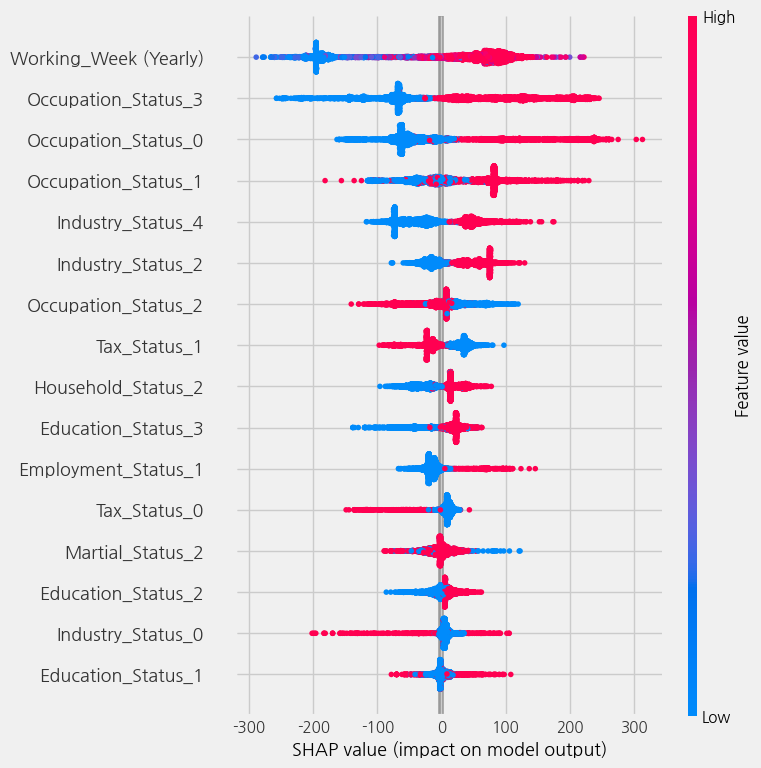

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

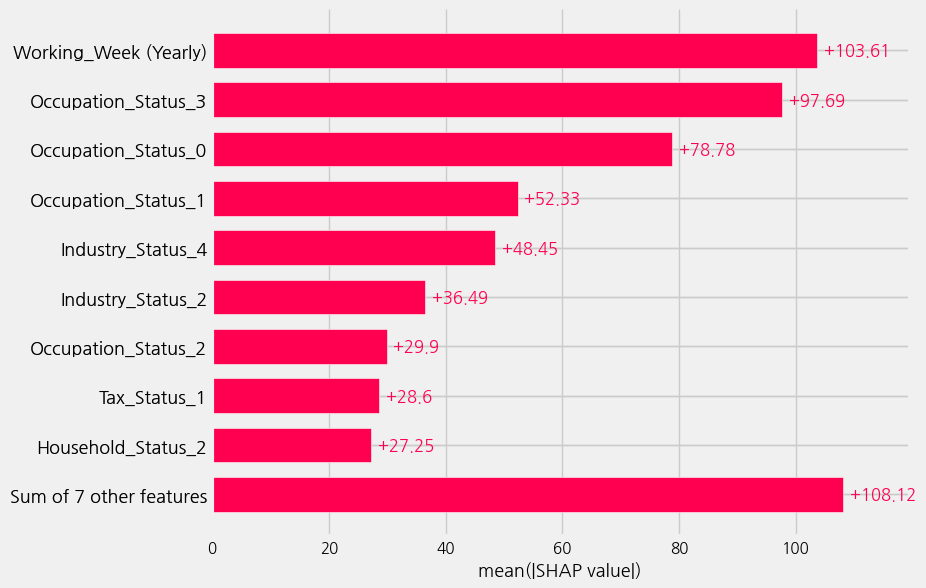

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

                 Variable      Weight
0   Working_Week (Yearly)  103.606821
2     Occupation_Status_3   97.691003
3     Occupation_Status_0   78.781180
12    Occupation_Status_1   52.325625
5       Industry_Status_4   48.450086
4       Industry_Status_2   36.489526
1     Occupation_Status_2   29.900950
9            Tax_Status_1   28.596384
6      Household_Status_2   27.245825
10     Education_Status_3   26.795680
7     Employment_Status_1   19.321245
8            Tax_Status_0   14.925351
15       Martial_Status_2   13.716345
11     Education_Status_2   13.091305
13      Industry_Status_0   10.665693
14     Education_Status_1    9.607604


## Support Vector Regressor(SVR)

In [ ]:
%%time
from sklearn.svm import SVR

modelV11 = SVR()

print('\nSVR')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV11,enc_tr,enc_te,y_te)


SVR
(15973, 54) / (15973,)
CPU times: user 29.1 s, sys: 145 ms, total: 29.2 s
Wall time: 29.6 s


,MAE,RMSE,R-squared,Adjusted-R-squared
0,355.651766,611.970833,0.206101,0.195218


In [ ]:
# 391 / 647
modelV11_s = SVR(C = 0.1, kernel = "linear", gamma = 0.001, degree = 2, epsilon = 0.01)


In [ ]:
%%time
from sklearn.svm import SVR

modelV11_s = SVR(C = 0.1, kernel = "linear", gamma = 0.001, degree = 2, epsilon = 0.01)

print('\nSVR_s')
print(f'{enc_tr.shape} / {y_tr.shape}')
train_model(modelV11_s,enc_tr,enc_te,y_te)


SVR_s
(15973, 23) / (15973,)
CPU times: user 8min 50s, sys: 835 ms, total: 8min 51s
Wall time: 9min 12s


,MAE,RMSE,R-squared,Adjusted-R-squared
0,440.979114,671.273694,0.117677,0.112565


### - 최적 파라미터 찾기 - GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR

In [ ]:
# 모델 설정
svr = SVR()

# 파라미터 그리드 설정
param_grid = {
    'C': [0.1],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.001],
    'epsilon': [0.01, 2],
    'degree': [2, 3, 4, 5]
}


In [ ]:
%%time
# Grid Search 실행
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(enc_tr, y_tr)

print("Best parameters:", grid_search.best_params_)
print("Best score:", -grid_search.best_score_)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=linear; total time=   8.9s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=linear; total time=   8.8s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=linear; total time=   7.1s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=linear; total time=   8.9s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=linear; total time=   7.0s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=rbf; total time=  13.7s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=rbf; total time=  13.6s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=rbf; total time=  13.5s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=rbf; total time=  13.5s
[CV] END C=0.1, degree=2, epsilon=0.01, gamma=0.001, kernel=rbf; total time=  13.6s
[CV] END C=0.1, degree=2, epsilon=2, gamma=0.001, kernel=linear; total time=   8.7s


### - 최적 파라미터 찾기 - RandomSearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
from scipy.stats import expon, reciprocal

In [ ]:
# 모델 설정
svr = SVR()

# 파라미터 그리드 설정
param_dist = {
    'C': reciprocal(0.1, 1000),
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': expon(scale=1.0),
    'degree': reciprocal(2, 5),
    'epsilon': reciprocal(0.01, 2)

}


In [ ]:
# Random Search 실행
random_search = RandomizedSearchCV(svr, param_distributions=param_dist, n_iter=50, cv=5, scoring='neg_mean_squared_error', verbose=2, random_state=2024)
random_search.fit(enc_tr, y_tr)

print("Best parameters:", random_search.best_params_)
print("Best score:", -random_search.best_score_)

### - 최적 파라미터 찾기 - Bayesian Optimization

In [ ]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

In [ ]:
# 모델 설정
svr = SVR()

# 파라미터 공간 설정
param_space = {
    'C': Real(0.1, 100, prior='log-uniform'),
    'kernel': Categorical(['linear', 'rbf']),
    'gamma': Real(0.001, 10, prior='log-uniform'),
    'epsilon': Real(0.01, 2, prior='log-uniform'),
}

In [ ]:
# Bayesian Optimization 실행
bayes_search = BayesSearchCV(svr, param_space, n_iter=32, cv=5, scoring='neg_mean_squared_error', verbose=2, random_state=2024)
bayes_search.fit(enc_tr, y_tr)

print("Best parameters:", bayes_search.best_params_)
print("Best score:", -bayes_search.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=5.300583464792834, epsilon=0.015343152489326791, gamma=0.04494715504626182, kernel=rbf; total time=  12.4s
[CV] END C=5.300583464792834, epsilon=0.015343152489326791, gamma=0.04494715504626182, kernel=rbf; total time=  12.7s
[CV] END C=5.300583464792834, epsilon=0.015343152489326791, gamma=0.04494715504626182, kernel=rbf; total time=  12.2s
[CV] END C=5.300583464792834, epsilon=0.015343152489326791, gamma=0.04494715504626182, kernel=rbf; total time=  11.3s
[CV] END C=5.300583464792834, epsilon=0.015343152489326791, gamma=0.04494715504626182, kernel=rbf; total time=  12.4s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END C=0.3724213001685658, epsilon=0.08636814644801573, gamma=5.656777488710966, kernel=linear; total time=   9.8s
[CV] END C=0.3724213001685658, epsilon=0.08636814644801573, gamma=5.656777488710966, kernel=linear; total time=  10.2s
[CV] END C=0.3724213001685658, epsilon=0.0863681464480

In [ ]:
modelV11_s = SVR(**bayes_search.best_params_)

print(f'{enc_tr.shape} / {y_tr.shape}')

(15973, 19) / (15973,)


In [ ]:
train_model(modelV11_s,enc_tr,enc_te,y_te)

,MAE,RMSE,R-squared,Adjusted-R-squared
0,470.065325,682.584942,0.087691,0.083329


#### - Feature Importance

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV11_s)
shap_values = explainer(enc_te)

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, X_te_rb)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(X_tr_rb.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

In [ ]:
variable_weights['Variable'].values

In [ ]:
model.save_model('CatBoost.cbm')

In [ ]:
%%time
# SHAP 값 계산
explainer = shap.Explainer(modelV9, enc_tr)
shap_values = explainer(enc_te, check_additivity=False)

TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: SVR()

In [ ]:
# 피처 중요도 출력
shap.summary_plot(shap_values, enc_te)

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0])

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
# 변수별 가중치 추출
mean_absolute_shap_values = np.mean(np.abs(shap_values.values), axis=0)
variable_weights = pd.DataFrame(list(zip(enc_tr.columns, mean_absolute_shap_values)),
                                columns=['Variable', 'Weight'])
variable_weights = variable_weights.sort_values(by='Weight', ascending=False)

print(variable_weights)

## Submission

In [ ]:
# 모델 평가
def eval_model(X_te,y_te, y_pred):
  from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

  # 데이터의 샘플 크기
  n = len(y_te)

  # 독립 변수의 수
  p = X_te.shape[1]

  rmse = mean_squared_error(y_te, np.round(y_pred), squared=False)
  mae = mean_absolute_error(y_te, np.round(y_pred))
  r2 = r2_score(y_te, y_pred)
  # 조정된 결정계수 계산
  adjusted_r_squared = 1 - (1 - r2) * (n - 1) / (n - p - 1)

  return rmse,mae,r2,adjusted_r_squared

In [ ]:
y_pred = modelV10_s.predict(enc_te)
rmse,mae,r2,adjusted_r_squared = eval_model(enc_tr,y_te,y_pred)
print(f'model: {rmse,mae,r2,adjusted_r_squared}')

model: (586.8691954022646, 330.99081956267736, 0.2878205975357161, 0.2818258214206968)


In [ ]:
ori_te_pred = modelV10_s.predict(np.round(enc_ori_te))
ori_te_pred.shape

(10000,)

In [ ]:
args.results.append(
    {
        'model': 'modelV10_s',
        'RMSE': rmse,
        'MAE': mae,
        'r2': r2,
        'adjusted_r_squared': adjusted_r_squared,
        'ori_te_pred': ori_te_pred,
        'len_features': enc_tr.shape[1],
        'create_dt': '0407'
    }
)

args.results

[{'model': 'modelV10_s',
  'RMSE': 589.0563193399803,
  'MAE': 328.4122850943081,
  'r2': 0.2825012179066906,
  'adjusted_r_squared': 0.2764616658688681,
  'ori_te_pred': array([ -2.4518223 ,  -4.49802246, 458.91781126, ..., 373.73439764,
           2.98174245, 496.96278002]),
  'len_features': 50,
  'create_dt': '0407'},
 {'model': 'modelV10',
  'RMSE': 589.0563193399803,
  'MAE': 328.4122850943081,
  'r2': 0.2825012179066906,
  'adjusted_r_squared': 0.2764616658688681,
  'ori_te_pred': array([ -2.4518223 ,  -4.49802246, 458.91781126, ..., 373.73439764,
           2.98174245, 496.96278002]),
  'len_features': 50,
  'create_dt': '0407'},
 {'model': 'modelV10_s',
  'RMSE': 586.8691954022646,
  'MAE': 330.99081956267736,
  'r2': 0.2878205975357161,
  'adjusted_r_squared': 0.2818258214206968,
  'ori_te_pred': array([ -2.4518223 ,  -4.49802246, 458.91781126, ..., 373.73439764,
           2.98174245, 496.96278002]),
  'len_features': 50,
  'create_dt': '0407'}]

In [ ]:
submission = pd.read_csv(args.default_submission_csv)
submission.head()

,ID,Income
0,TEST_0000,0
1,TEST_0001,0
2,TEST_0002,0
3,TEST_0003,0
4,TEST_0004,0


In [ ]:
submission['Income'] = ori_te_pred
submission

,ID,Income
0,TEST_0000,-2.451822
1,TEST_0001,-4.498022
2,TEST_0002,458.917811
3,TEST_0003,635.271473
4,TEST_0004,-0.143494
...,...,...
9995,TEST_9995,995.155212
9996,TEST_9996,988.703208
9997,TEST_9997,373.734398
9998,TEST_9998,2.981742


## 예측결과 저장

In [ ]:
submission.to_csv(args.default_path+'/20240408_3_submission.csv', index=False)